##**Part I**

###**A.Policy Iteration**
It is a way to find the optimal policy for all states and actions.

We show the policy by $\pi$ which assigns an action to each state. We show the assigned action of a state by policy with $\pi(s)$.

###**Steps**
 1. Evaluate the policy by calculating the value function for all states under that policy. The value function is calculated by following equation.

 $V^\pi(s) = E[R(s,\pi(s),s') + \gamma V(s')] = \sum_{s' \in S} P_{\pi(s)} (s' \mid s, π(s))\ [R(s,π(s),s') +  \gamma\ V^\pi(s') ]$

Value function = the expected reward collected at the first step + expected discounted value at the next state
 2. In this step we want to improve the policy. It means we want to find a better action for each state. The following equation shows how we do that.

 $\pi_1(s) = argmax_{a ∈ A}  E[R(s,\pi(s),s') + \gamma V(s')]$

 3. Then we will repeat these steps until the value function converge to optimal value function. In other word we reapeat these steps until our policy doesn't change.


###**Example**
Lets see this in an example.

Find the optimal policy for a planing problem (4x4 grid)

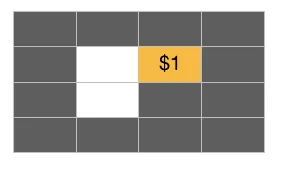

Source: www.medium.com

Three states s(x,y) : s(2,2) s(2,3) s(3,2)
Four actions 𝝅(s): go up, go down, go left, go right

For a given action 𝝅(s) under the policy, the probability that action will be done is 0.70. and the other actions will have the probability at 0.10.
If an agent is at the goal s(3,2), the agent will stop with probability of 1.

Let’s a discount factor (𝛄) equals 0.9.

So we start with a random policy. So for each state s wich is not the goal we set $\pi(s) = right$

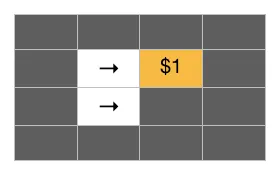

Source: www.medium.com

So the probability of actions for these states are:

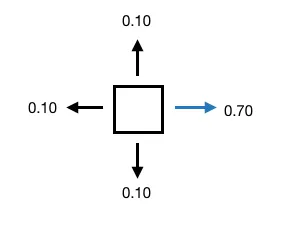

Source: www.medium.com

Now we calculate the value function for the policy $\pi$.

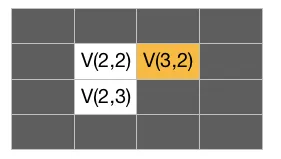

Source: www.medium.com

$V(3,2) = 1(1 + 0.9V(3.2))$

$V(2,2) = 0.7(1 + 0.9V(3,2)) + 0.1(0 + 0.9V(2,3)) + 0.2(0 + 0.9V(2,2))$

$V(2,3) = 0.9(0 + 0.9V(2,3)) + 0.1(0 + 0.9V(2,2))$

So if we solve this equations we have:

$V(3,2) = 10$

$V(2,2) = 9$

$V(3,2) = 4.265$

In this step we are going to improve policy based on the value function that we calculated in last step.

Our first policy was:


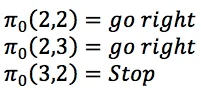

Source: www.medium.com

Using explained equation, we update our policy as you can see in these two following pictures

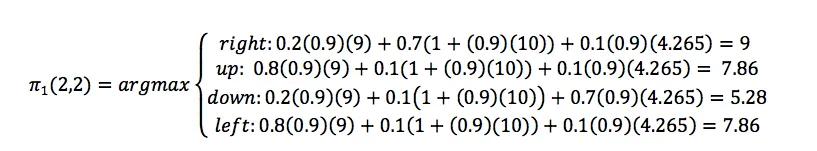

Source: www.medium.com

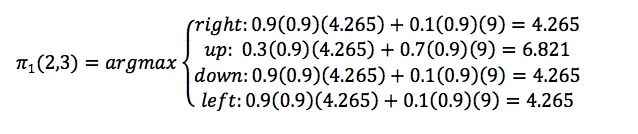

Source: www.medium.com

So the new policy would be:

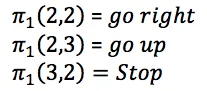

Source: www.medium.com

Now we have to repeat these steps until the policy doesn't change.

So we have to calculate the value function based on new policy.

$V(3,2) = 1(1 + 0.9V(3.2))$

$V(2,2) = 0.7(1 + 0.9V(3,2)) + 0.1(0 + 0.9V(2,3)) + 0.2(0 + 0.9V(2,2))$

$V(2,3) = 0.3(0 + 0.9V(2,3)) + 0.7(0 + 0.9V(2,2))$

So after solving that we have:

$V(3,2) = 10$

$V(2,2) = 9.43$

$V(2,3) = 8.14$


So now we have to improve our policy based on the value function that we calculated in last step:



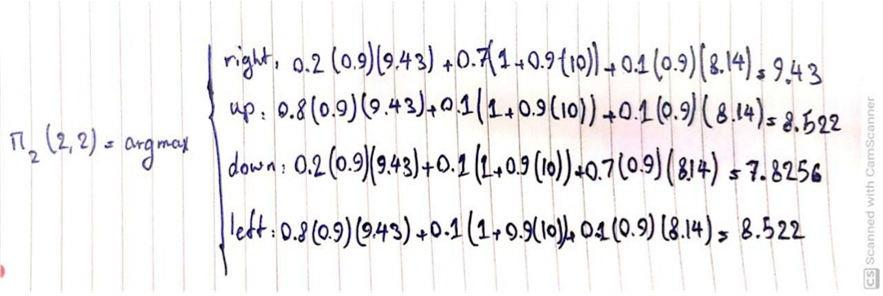

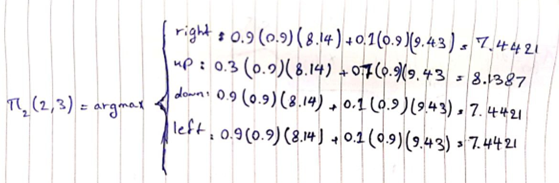

So the new policy is:

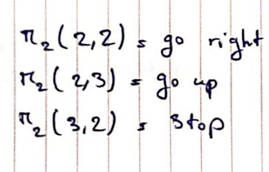

As you can see $\pi_2 = \pi_1$ so we found the optimal value function and the best policy.

###B.Code explanation and improve by hyperparameter optimization


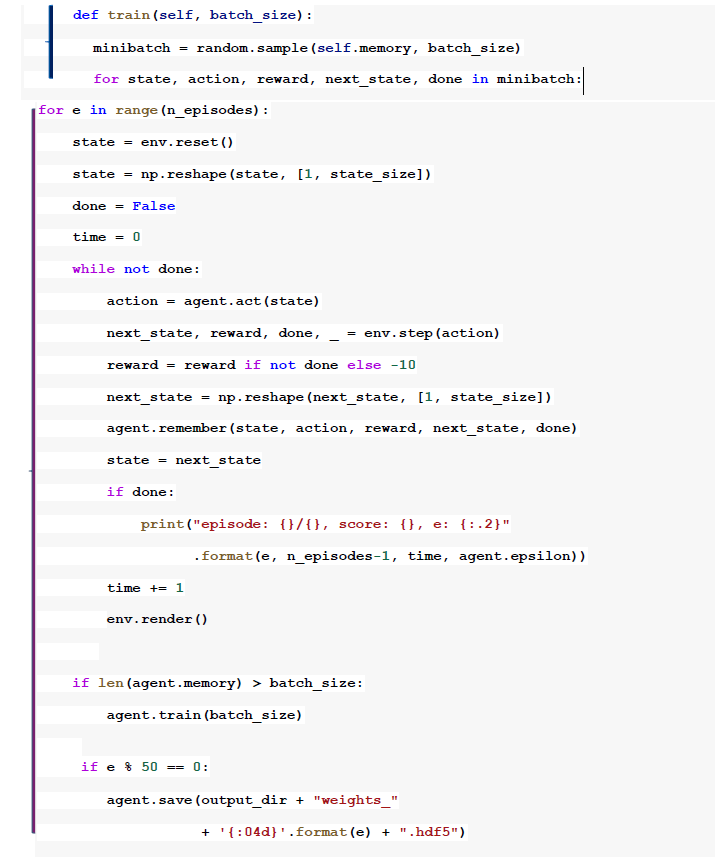

So in this part I am going to explain line by line of this train function. It has a batch size parameter which defines the number of samples from the memory (experiences) which we are choosing randomly for training.

In next line (minibatch = random.sample(self.memory, batch_size)) we are using the agent memory and randomly we take "batch size" number of samples from the memory so we define a mini batch which contains these experiences from the agent memory.

In next line (for state, action, reward, next_state, done in minibatch:) we have a loop on the experiences and as you can see each experience contains a state, an action,  a reward, and the next_state which we go into it with that action. It also contains a done flag which says if the game is finished or not. In this loop it should have some logic which train the agent based on the experiences agent has. This is done by calculating the target values and also training the NN in this model.

In the next code, we have the epsiodes loop(for e in range(n_episodes):). It iterate over episodes of gameplay.

After that we have these 4 line of code:

state = env.reset()

state = np.reshape(state, [1, state_size])

done = False

time = 0

So at first we reset the environment to the initial state. Then we reshape it into the shape that our model accepts. The done flag is initialized by False because we are just going to start the game. And the time value is set to 0.

After that we have a while which is in next code block

In [ ]:
while not done:
    action = agent.act(state)
    next_state, reward, done, _ = env.step(action)
    reward = reward if not done else -10
    next_state = np.reshape(next_state, [1, state_size])
    agent.remember(state, action, reward, next_state, done)
    state = next_state
    if done:
        print("episode: {}/{}, score: {}, e: {:.2}".format(e, n_episodes-1, time, agent.epsilon))
    time += 1
    env.render()

So it is going on until the game ends and the done flag is True. In the loop in the first line the agent acts considering the state which it is in it. Then the environment returns the next state, reward and done flage based on the agents action. After that we save the reward which is reward +1 for each additional frame with pole upright and -10 for ending the game. Then we reshape the next state into the shape that the model accepts (to pass it into NN). Then we add this experience into the agents memory. It contains the state and the action which agent done, the reward and next state based on the state and action and the done flag. Then we update our state for the next while loop. After that we check if the episode is done we print a summery of the episode such as agent's epsilon and epsisode's score. In the next line of code we update the time and after that we render the environment to visualize the episode (not neccessery)

In this part of code
 ```
if len(agent.memory) > batch_size:
    agent.train(batch_size)
```
It says if we have enough memory or in other word we have enough experiences in our agent memory, we train the agent by replaying the experiences of the episode


In the last part of this code:

```
if e % 50 == 0:
    agent.save(output_dir + "weights_" + '{:04d}'.format(e) + ".hdf5")
```

It just saves the weights in each 50 episodes.

###**Improving the given code by hyperparameter optimization**

# 1. Import dependencies

In [ ]:
import random
import gym
import numpy as np
from collections import deque
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Nadam
from keras.optimizers import Adam
from IPython.display import HTML
import os


# 2. Hyperparameters and initialise environment

In [ ]:
env = gym.make('CartPole-v0') # initialise environment
state_size = env.observation_space.shape[0]

/usr/local/lib/python3.10/dist-packages/gym/envs/registration.py:593: UserWarning: WARN: The environment CartPole-v0 is out of date. You should consider upgrading to version `v1`.
  logger.warn(
/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.10/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(


# 3. The agent can take two actions-right or left

In [ ]:
action_size = env.action_space.n
action_size

2


# 4. Number of games that the agent is going to play

In [ ]:
n_episodes = 200
batch_size = 32

# 5. Storing the model output

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
output_dir = '/content/drive/MyDrive/810101540_Amir_NaddafFahmideh_P3/cartpole'

In [ ]:
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

#6.DQNAgent
# Step 1:  Python class is used to define our DQNAgent.
# Step 2 : Neural Net to approximate Q-value function. Q is a function of s,a,theta.
# Step 3: List of previous experiences, enabling re-training later.
# Step 4:  Train NN with experiences sampled from memory.
# Step 5: We save our model so we can use it later.



In [ ]:
class DQNAgent:
    def __init__(self, state_size, action_size):
        self.state_size = state_size
        self.action_size = action_size
        self.memory = deque(maxlen=2000) # deque is like list and we can append elements to it.
        self.gamma = 0.95 # discount rate.
        self.epsilon = 1.0 # exploration rate: how much to act randomly.
        self.epsilon_decay = 0.995 # decrease number of random explorations as the agent's performance improves.
        self.epsilon_min = 0.01 # minimum amount of random exploration permitted.
        self.learning_rate = 0.001 # learning rate.
        self.model = self._build_model() # This is a private method

    #==============================================================================================
    #Step 2

    def _build_model(self):
        # neural net to approximate Q-value function.# Q is a f of s,a,theta
        model = Sequential()
        model.add(Dense(32, activation='relu', input_dim=self.state_size))
        model.add(Dense(32, activation='relu'))
        model.add(Dense(self.action_size, activation='linear')) # 2 actions. 2 output neurons: 0 and 1 (L/R)
        model.compile(loss='mse',
                      optimizer=Nadam(learning_rate=self.learning_rate)) # You can change this to Adam or other optimisers.
        return model

    #==================================================================================================

    #Step 3

    def remember(self, state, action, reward, next_state, done): # done means game is over or final or early termination.
        self.memory.append((state, action,
                            reward, next_state, done)) # list of previous experiences, enabling re-training later
     #=====================================================================================================

    # Step 4# [This will be part of your third project]#

    def train(self, batch_size): # method that trains NN with experiences sampled from memory
        minibatch = random.sample(self.memory, batch_size) # sample a minibatch from memory
        for state, action, reward, next_state, done in minibatch: # extract data for each minibatch sample
            target = reward # if done, then target = reward
            if not done: # if not done, then predict future discounted reward
                target = (reward +  # target here predicts the agent future rewards from the next state
                          self.gamma * # (target) = reward + (discount rate gamma) * # Using Bellman equation
                          np.amax(self.model.predict(next_state)[0])) # (maximum Q value based on future action a')
            target_f = self.model.predict(state) # map current state to our prediction of future discounted reward
            target_f[0][action] = target # We use the discounted future rewards based on the action that the agent took.
            self.model.fit(state, target_f, epochs=1, verbose=0) # using the NN to see which action is optimal,given s
        if self.epsilon > self.epsilon_min: # epochs=1 b/c no need to use recycle data. We can generate data by OpenAIGym
            self.epsilon *= self.epsilon_decay # Here we are adjusting the value of epsilon if the condition is true.

    def act(self, state):
        if np.random.rand() <= self.epsilon: # if acting randomly, take random action. take a random no from 0 to 1.
            return random.randrange(self.action_size) # The agent at this stage will explore
        act_values = self.model.predict(state) # if not acting randomly, predict reward value based on current state
        # As time progresses, the agent will take less random action=> the agent will exploit.
        # Our model will be used to predict the highest reward based on two actions.
        return np.argmax(act_values[0]) # pick the action that will give maximise the agent reward (left or right)

    #============================================================================================================

    # Step 5
    # We save our model so we can use it later.

    def save(self, name):
        self.model.save_weights(name)

    def load(self, name):
        self.model.load_weights(name)

###Finding the best hyper parameters using keras-tuner

In [ ]:
pip install keras-tuner

In [ ]:
import keras_tuner as kt


class DQNTuner(kt.RandomSearch):
    def __init__(self, hypermodel, agent1, **kwargs):
        super(DQNTuner, self).__init__(hypermodel=hypermodel, **kwargs)
        self.agent = agent1

    def run_trial(self, trial, *args, **kwargs):
        model = self.hypermodel.build(trial.hyperparameters)
        total_rewards = 0
        done = False
        batch_size = 32
        for e in range(10): # iterate over episodes of gameplay

            state = env.reset() # reset state and get four random states.
            state = np.reshape(state, [1, state_size]) # To pass this to the NN.

            done = False
            time = 0 # goal is to keep pole upright as long as possible.
            while not done:
    # This while loop ends if we get to 200 timesteps or the pole falls, or cart disappears from the screen.
                action = agent.act(state) # Given the state, the agent takes an action (move cart left or right).
                next_state, reward, done, _ = env.step(action) # agent interacts with env, gets feedback; 4 state data points.
                reward = reward if not done else -10 # reward +1 for each additional frame with pole upright and -10 for ending the game.
                total_rewards += reward
                next_state = np.reshape(next_state, [1, state_size]) # To pass this to the NN.
                agent.remember(state, action, reward, next_state, done) # To remember the previous timestep's state, actions, reward, etc.
                state = next_state # set current state to the current next state for the next while loop
                if done: # if episode ends:
                    print("episode: {}/{}, score: {}, e: {:.2}" # print the episode's score and agent's epsilon
                          .format(e, 99, time, agent.epsilon))
                time += 1

        #env.render()

            if len(self.agent.memory) > batch_size:
              self.agent.train(batch_size)
        return total_rewards



In [ ]:
# Define the model building function
def build_model(hp):
    model = Sequential()
    model.add(Dense(units=hp.Int('units', min_value=32, max_value=256, step=32), activation='relu', input_shape=(state_size,)))
    model.add(Dense(units=hp.Int('units', min_value=32, max_value=256, step=32), activation='relu'))
    model.add(Dense(action_size, activation='linear'))
    model.compile(optimizer='adam', loss='mse')
    return model

agent = DQNAgent(state_size, action_size)

# Initialize the tuner with the hypermodel and other parameters
tuner = DQNTuner(
    hypermodel=build_model,
    agent1=agent,
    overwrite=True,
    max_trials=10,
    objective=kt.Objective('score', direction="max")
)

In [ ]:
tuner.search()

tuner.results_summary()

Trial 10 Complete [00h 01m 27s]
score: 138.0

Best score So Far: 249.0
Total elapsed time: 00h 16m 55s
Results summary
Results in ./untitled_project
Showing 10 best trials
Objective(name="score", direction="max")

Trial 07 summary
Hyperparameters:
units: 64
Score: 249.0

Trial 08 summary
Hyperparameters:
units: 160
Score: 186.0

Trial 05 summary
Hyperparameters:
units: 256
Score: 182.0

Trial 09 summary
Hyperparameters:
units: 512
Score: 138.0

Trial 00 summary
Hyperparameters:
units: 288
Score: 135.0

Trial 01 summary
Hyperparameters:
units: 320
Score: 128.0

Trial 06 summary
Hyperparameters:
units: 224
Score: 122.0

Trial 04 summary
Hyperparameters:
units: 192
Score: 88.0

Trial 02 summary
Hyperparameters:
units: 448
Score: 84.0

Trial 03 summary
Hyperparameters:
units: 352
Score: 53.0


###**C. FrozenLake game**



Frozen lake game consists of 4 x 4 grid blocks, where each block can have one of the following four states:

- S: Starting point/Safe state

- F: Frozen surface/Safe state

- H: Hole/Unsafe state

- G: Goal/Safe or Terminal state

Each of the blocks is an state and the goal is to go from the first state into the goal state without going into H state.

In each state we have four actions (go up, go down, go left, go right)

The defined reward for goal state when the agent gets into it, is 1 otherwise it gets 0 reward.


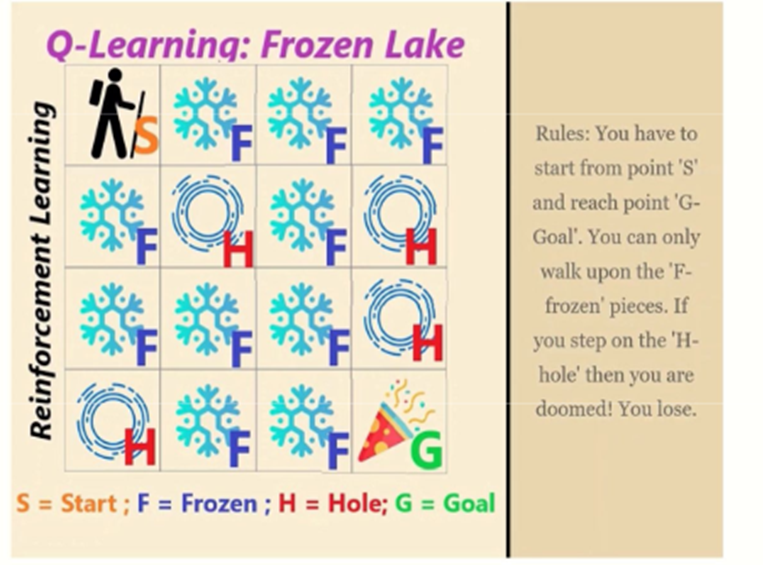

In [ ]:
!pip install gym

Import Libararies

In [ ]:
import random
import gym
import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from keras.optimizers import Adam
from collections import deque
import os

Load the evironment

In [ ]:
env = gym.make('FrozenLake-v1', is_slippery = False)

/usr/local/lib/python3.10/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.10/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(


Set the action size

In [ ]:
action_space_size = env.action_space.n
action_space_size


4

Set the state size

In [ ]:
state_space_size = env.observation_space.n
state_space_size

16

Build our DQN agent class

In [ ]:
class DQNAgent:
    def __init__(self, state_size, action_size):
        self.state_size = state_size
        self.action_size = action_size
        self.memory = deque(maxlen=2000) # deque is like list and we can append elements to it.
        self.gamma = 0.95 # discount rate.
        self.epsilon = 1.0 # exploration rate: how much to act randomly.
        self.epsilon_decay = 0.995 # decrease number of random explorations as the agent's performance improves.
        self.epsilon_min = 0.01 # minimum amount of random exploration permitted.
        self.learning_rate = 0.001 # learning rate.
        self.model = self._build_model() # This is a private method

    #==============================================================================================

    def _build_model(self):
        # neural net to approximate Q-value function.# Q is a f of s,a,theta
        model = Sequential()
        model.add(Dense(32, activation='relu', input_dim=self.state_size))
        model.add(Dense(32, activation='relu'))
        model.add(Dense(self.action_size, activation='linear')) # 4 actions.
        model.compile(loss='mse',
                      optimizer=Adam(learning_rate=self.learning_rate)) # You can change this to Adam or other optimisers.
        return model

    #==================================================================================================


    def remember(self, state, action, reward, next_state, done): # done means game is over or final or early termination.
        self.memory.append((state, action,
                            reward, next_state, done)) # list of previous experiences, enabling re-training later
     #=====================================================================================================

    def train(self, batch_size): # method that trains NN with experiences sampled from memory
        minibatch = random.sample(self.memory, batch_size) # sample a minibatch from memory
        for state, action, reward, next_state, done in minibatch: # extract data for each minibatch sample
            target = reward # if done, then target = reward
            if not done: # if not done, then predict future discounted reward
                target = (reward +  # target here predicts the agent future rewards from the next state
                          self.gamma * # (target) = reward + (discount rate gamma) * # Using Bellman equation
                          np.amax(self.model.predict(next_state)[0])) # (maximum Q value based on future action a')
            target_f = self.model.predict(state) # map current state to our prediction of future discounted reward
            target_f[0][action] = target # We use the discounted future rewards based on the action that the agent took.
            self.model.fit(state, target_f, epochs=1, verbose=0) # using the NN to see which action is optimal,given s
        if self.epsilon > self.epsilon_min: # epochs=1 b/c no need to use recycle data. We can generate data by OpenAIGym
            self.epsilon *= self.epsilon_decay # Here we are adjusting the value of epsilon if the condition is true.

    def act(self, state):
        if np.random.rand() <= self.epsilon: # if acting randomly, take random action. take a random no from 0 to 1.
            return random.randrange(self.action_size) # The agent at this stage will explore
        act_values = self.model.predict(state) # if not acting randomly, predict reward value based on current state
        # As time progresses, the agent will take less random action=> the agent will exploit.
        # Our model will be used to predict the highest reward based on two actions.
        return np.argmax(act_values[0]) # pick the action that will give maximise the agent reward (left or right)

make an agent and set the batch size and total episodes. Also initialize our total win to 0.

In [ ]:
agent = DQNAgent(state_size, action_size)
episodes = 200
batch_size = 32
total_wins = 0

Train the agent.

In [ ]:
for e in range(episodes): # iterate over episodes of gameplay

    state = env.reset() # reset state and environment
    state = np.identity(state_size)[state:state+1] # To pass this to the NN.

    done = False
    while not done:
    # This while loop ends if we get to 200 timesteps or we lose or win.
        action = agent.act(state) # Given the state, the agent takes an action (move up, down, left, right).
        next_state, reward, done, _ = env.step(action) # agent interacts with env, gets feedback; 4 state data points.

        next_state = np.identity(state_size)[next_state:next_state+1] # To pass this to the NN.
        agent.remember(state, action, reward, next_state, done) # To remember the previous timestep's state, actions, reward, etc.
        state = next_state # set current state to the current next state for the next while loop

        if done: # if episode ends:
            print("episode: {}/{}, win?: {}, epsilon: {:.2}" # print the episode's score and agent's epsilon
                  .format(e, n_episodes-1, bool(reward), agent.epsilon))
            total_wins += reward

    if len(agent.memory) > batch_size:
        agent.train(batch_size) # train the agent by replaying the experiences of the episode
    if e % 30 == 0:
        print(f"wins after {e} episodes: {total_wins}")

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 39ms/step
episode: 126/199, win?: False, epsilon: 0.54
1/1 [==============================] - 0s 18ms/step
episode: 127/199, win?: False, epsilon: 0.54
1/1 [==============================] - 0s 26ms/step
episode: 128/199, win?: False, epsilon: 0.54
1/1 [==============================] - 0s 27ms/step
episode: 129/199, win?: False, epsilon: 0.53
1/1 [==============================] - 0s 28ms/step
episode: 130/199, win?: True, epsilon: 0.53
1/1 [==============================] - 0s 38ms/step
episode: 131/199, win?: True, epsilon: 0.53
1/1 [==============================] - 0s 24ms/step
episode: 132/199, win?: False, epsilon: 0.53
1/1 [==============================] - 0s 29ms/step
episode: 133/199, win?: True, epsilon: 0.52
1/1 [==============================] - 0s 35ms/step
episode: 134/199, win?: True, epsilon: 0.52
1/1 [==============================] - 0s 24ms/step
episode: 135/199, win?: True

Print the number of total wins

In [ ]:
print(f"wins after 200 episodes: {total_wins}")

wins after 200 episodes: 29.0


##**Part II**

###**A.LSTM**



LSTM is an improved version of the regular RNN which was designed to make it easy to capture long-term dependencies in sequence data. A regular RNN functions in such a way that the hidden state activation is influenced by the other local activations nearest to them, which corresponds to a “short-term memory”, while the network weights are influenced by the computations that take place over entire long sequences, which corresponds to “long-term memory”. Hence the RNN was redesigned so that it has an activation state that can also act as weights and preserve information over long distances, hence the name “Long Short-Term Memory”.


LSTMs are explicitly designed to avoid the long-term dependency problem.

###The Core Idea Behind LSTMs
The key to LSTMs is the cell state, the horizontal line running through the top of the diagram.


The cell state is kind of like a conveyor belt. It runs straight down the entire chain, with only some minor linear interactions. It’s very easy for information to just flow along with it unchanged. The hole architecture of LSTM is shown below. As you can see in the picture it has 3 gates.

- Forget gate
- Input gate
- Output gate

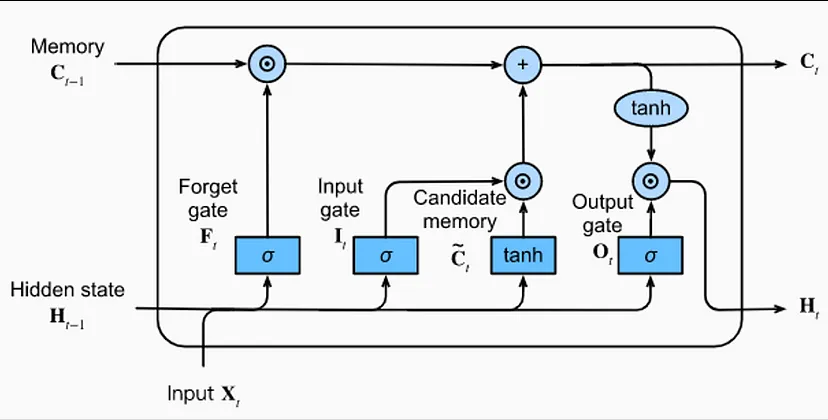

Source: https://d2l.ai/chapter_recurrent-modern/lstm.html

###Forget Gate
At any time t, an LSTM receives an input vector (X_[t]) as an input. It also receives the hidden state (H_[t−1]) and cell state (C_[t−1]) vectors determined in the previous instant (t− 1).

The first activity of the LSTM unit is executed by the forget gate. The forget gate decides (based on X_[t] and H_[t−1] vectors) what information to remove from the cell state vector coming from time t− 1. The outcome of this decision is a selector vector.
(A selector vector is a vector with values between zero and one and near these two extremes.)

The selector vector is multiplied element by element with the vector of the cell state received as input by the LSTM unit. This means that a position where the selector vector has a value equal to zero completely eliminates (in the multiplication) the information included in the same position in the cell state. A position where the selector vector has a value equal to one leaves unchanged (in the multiplication) the information included in the same position in the cell state.

In mathematical language the above explanation is:
  
  $f_t = \sigma(W_f \cdot [h_{t-1}, x_t] + b_f)$
- $(W_f$) and $(b_f$): Weights and biases for the gate f
- $(\sigma$) is the sigmoid activation function.

  $C_t^f = C_{t-1} \odot f_t$


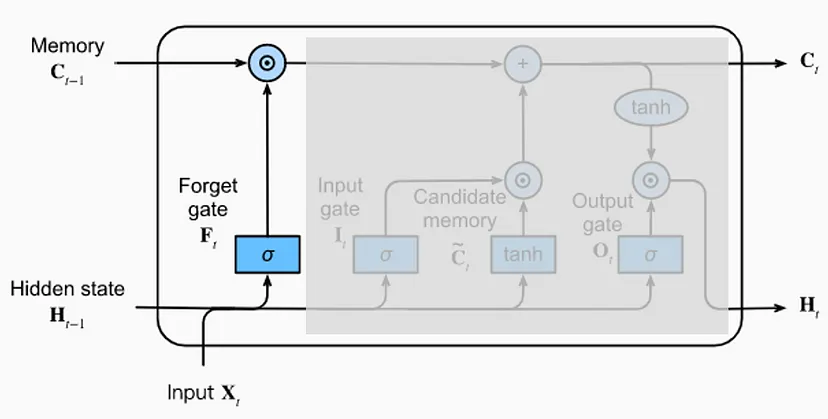

Source: https://d2l.ai/chapter_recurrent-modern/lstm.html

###Input Gate

After removing some of the information from the cell state received in input (C_[t−1]), we can insert a new one. This activity is carried out by two neural networks: the candidate memory and the input gate. The two neural networks are independent of each other. Their input are the vectors X_[t] and H_[t−1], concatenated together into a single vector.

The candidate memory is responsible for the generation of a candidate vector: a vector of information that is candidate to be added to the cell state.

Candidate memory output neurons use hyperbolic tangent function. The properties of this function ensure that all values of the candidate vector are between -1 and 1. This is used to normalize the information that will be added to the cell state.

The input gate is responsible for the generation of a selector vector which will be multiplied element by element with the candidate vector.

The selector vector and the candidate vector are multiplied with each other and
the result of the multiplication between the candidate vector and the selector vector is added to the cell state vector. This adds new information to the cell state.

The cell state, after being updated by the operations we have seen, is used by the output gate and passed into the input set used by the LSTM unit in the next instant (t+ 1).

In mathematical language the above explanation is:
  
   $i_t = \sigma(W_i \cdot [h_{t-1}, x_t] + b_i)$

   $\tilde{C}_t = \tanh(W_C \cdot [h_{t-1}, x_t] + b_C)$

   $C_t = C_t^f + i_t \odot \tilde{C}_t$

- $(\sigma$) is the sigmoid activation function.
- $(\tanh$) is the hyperbolic tangent function.
- $(W_i$) and $(b_i$): Weights and biases for the input gate
- $(W_i$) and $(b_i$): Weights and biases for the candidate memory

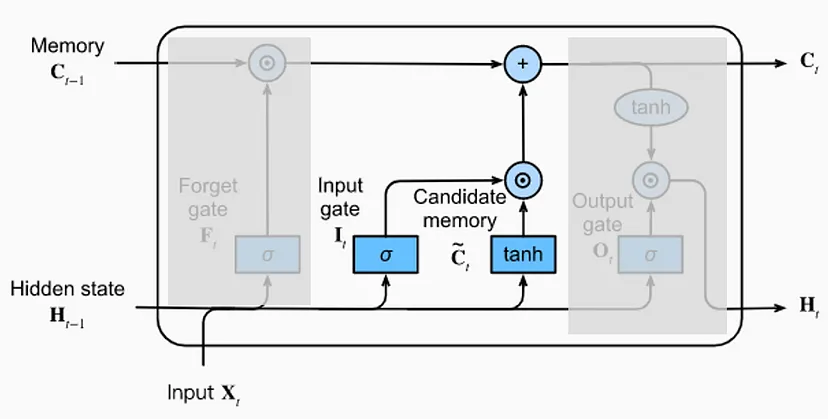

Source: https://d2l.ai/chapter_recurrent-modern/lstm.html

###Output Gate
The output gate determines the value of the hidden state outputted by the LSTM (in instant t) and received by the LSTM in the next instant (t+ 1) input set.

Output generation also works with a multiplication between a selector vector and a candidate vector. In this case, however, the candidate vector is not generated by a neural network, but it is obtained simply by using the hyperbolic tangent function on the cell state vector. This step makes the vector values of the cell state normalized within a range of -1 to 1. In this way, after multiplying with the selector vector (whose values are between zero and one), we get a hidden state with values between -1 and 1. This makes it possible to control the stability of the network over time.

The selector vector is generated from the output gate based on the values of X_[t] and H_[t−1] it receives as input. The output gate uses the sigmoid function as the activation function of the output neurons.

The selector vector and the candidate vector are multiplied with each other, element by element. This means that a position where the selector vector has a value equal to zero completely eliminates (in the multiplication) the information included in the same position in the candidate vector. A position where the selector vector has a value equal to one leaves unchanged (in the multiplication) the information included in the same position in the candidate vector.



In mathematical language the above explanation is:
  
   $o_t = \sigma(W_o \cdot [h_{t-1}, x_t] + b_o)$

   $h_t = \tanh(C_t) ⊙ o_t $

- $(\sigma$) is the sigmoid activation function.
- $(\tanh$) is the hyperbolic tangent function.
- $(W_o$) and $(b_o$): Weights and biases for the input gate

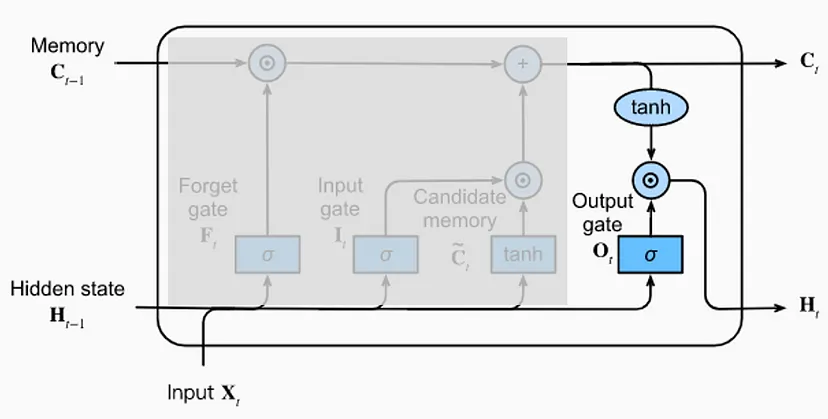

Source: https://d2l.ai/chapter_recurrent-modern/lstm.html

###Example
Let's see bbackpropagation in a complete example. Let's say our LSTM architecture is like that. And instead of concating H and X we use two different weights and biases, W and U.

All of these pictures are from https://blog.aidangomez.ca/2016/04/17/Backpropogating-an-LSTM-A-Numerical-Example/



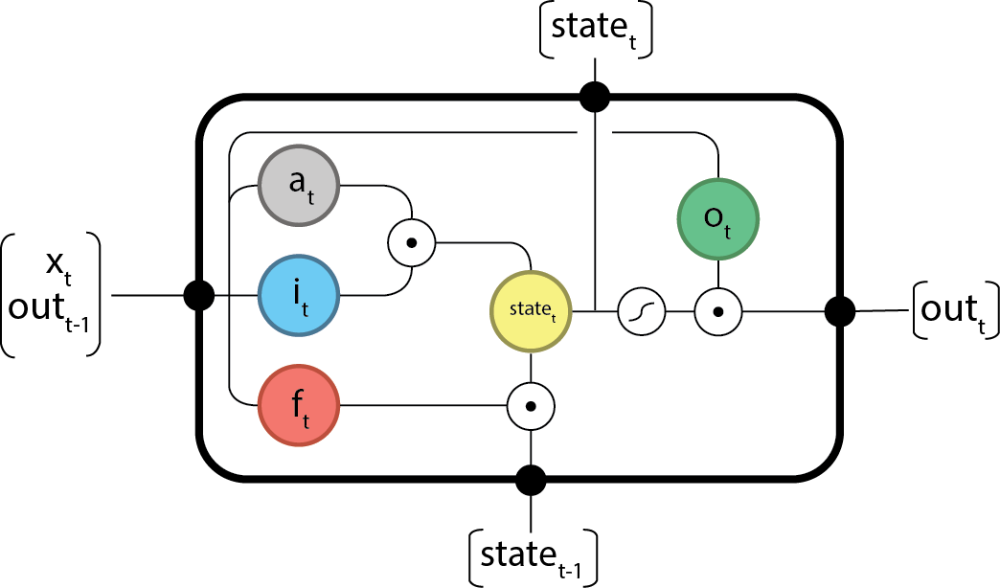

And let's review the notations and gates formula.

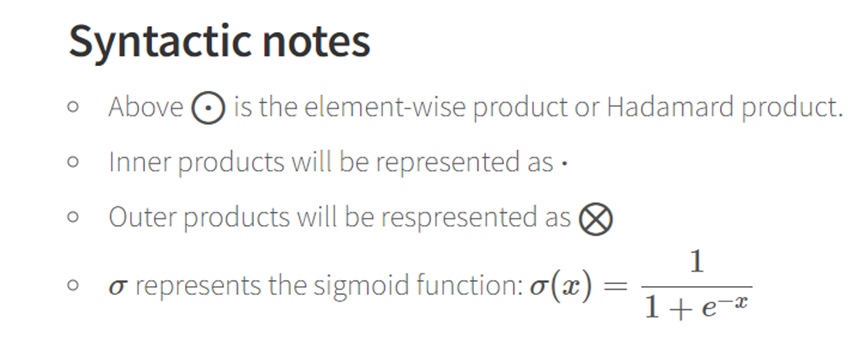

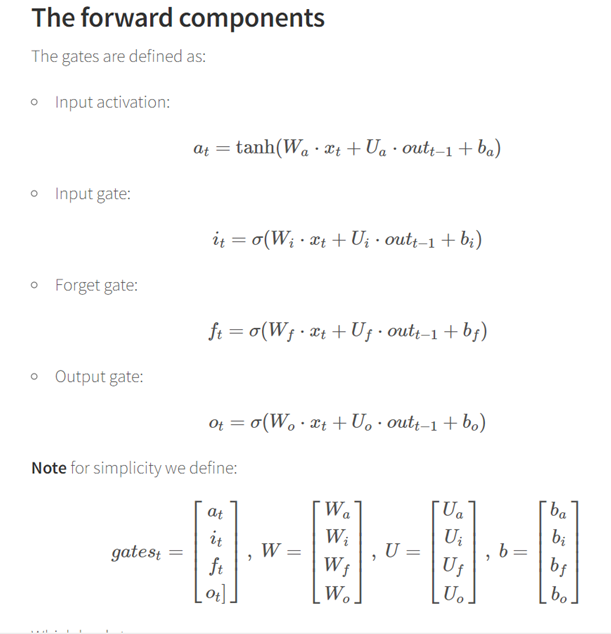

which leads to:

Internal state:

$statet=a_t⊙i_t+f_t⊙state_{t−1}$

Output:

$out_t=tanh(state_t)⊙o_t$

Now let's see the backpropagation equations.

Δt
 the output difference as computed by any subsequent layers (i.e. the rest of your network).


$Δout_t$
 the output difference as computed by the next time-step LSTM (the equation for t-1 is below).

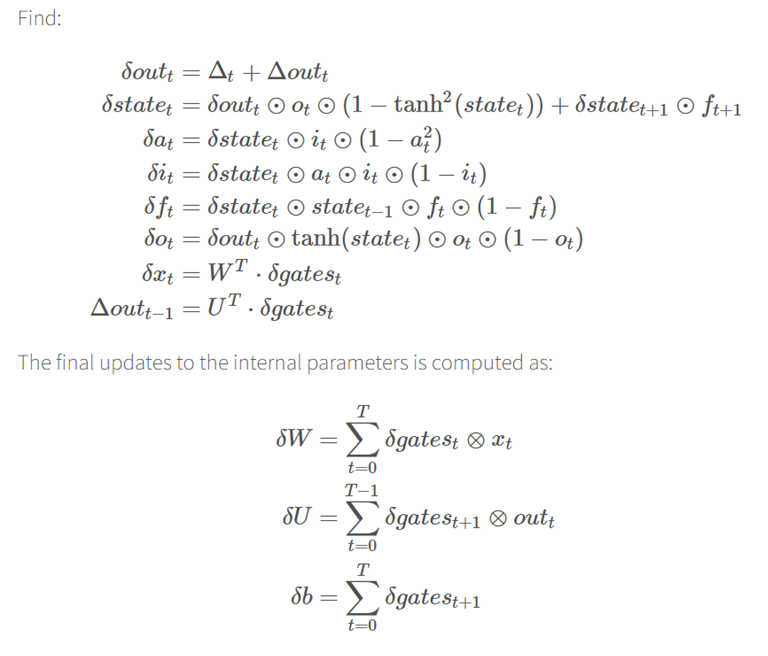

Now let's see the example and solve it.

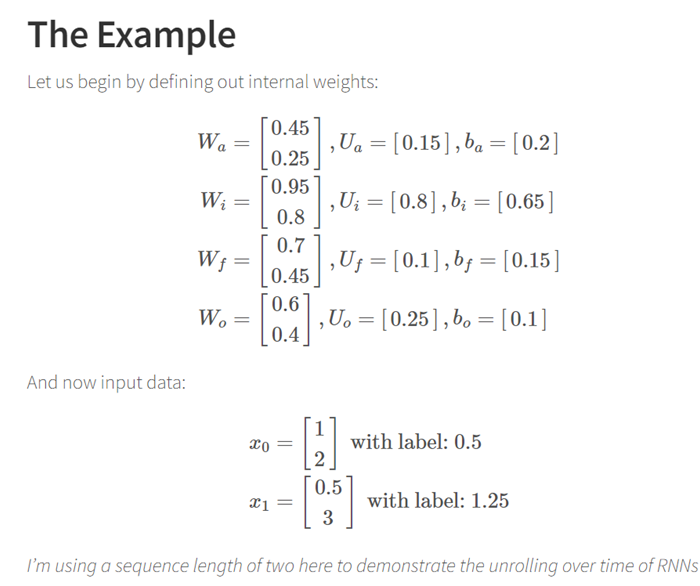

####Forward @ t=0

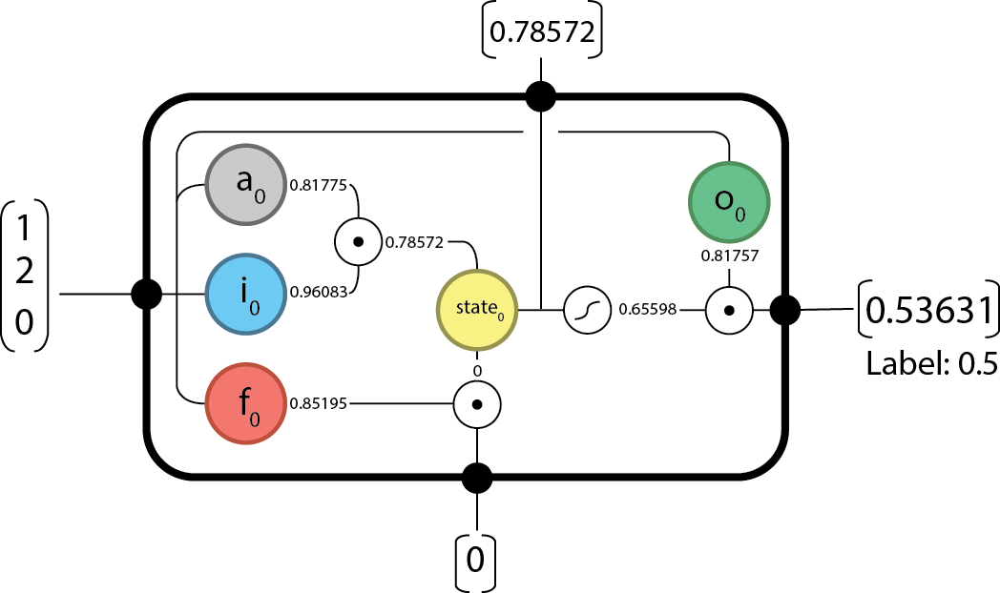

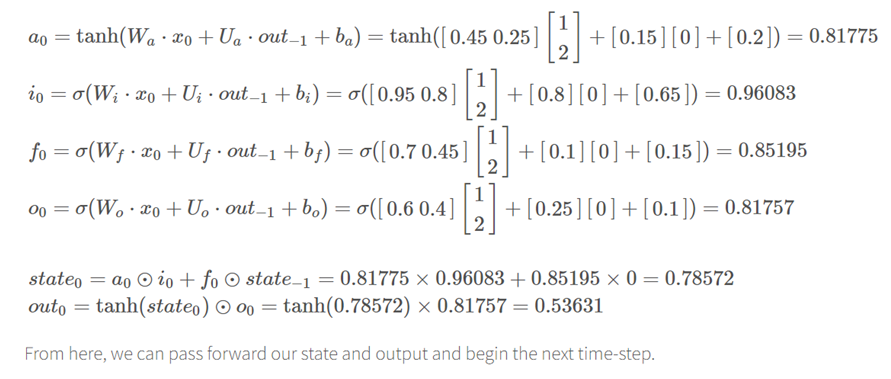

####Forward @ t=1

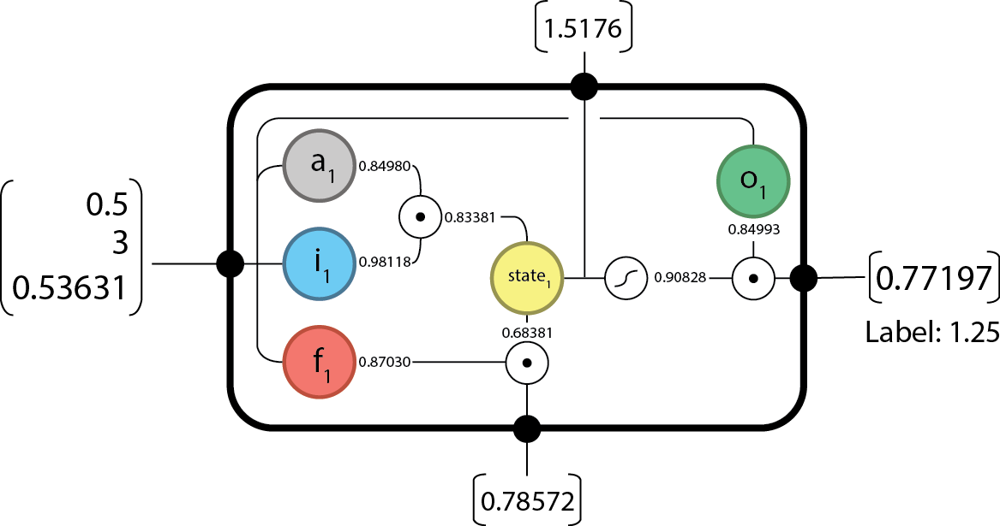


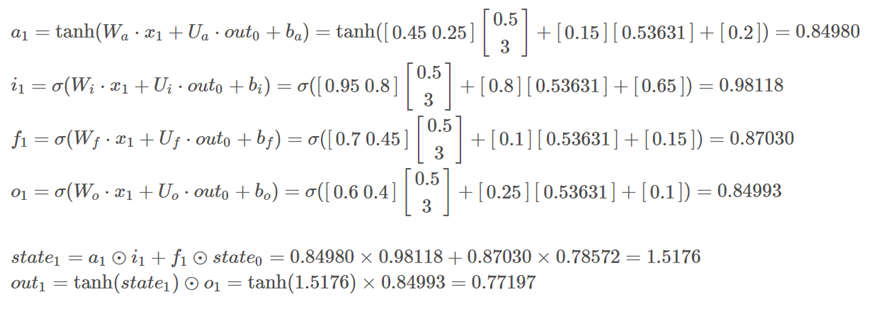

Now it's time to backpropagate

####Backward @ t=1

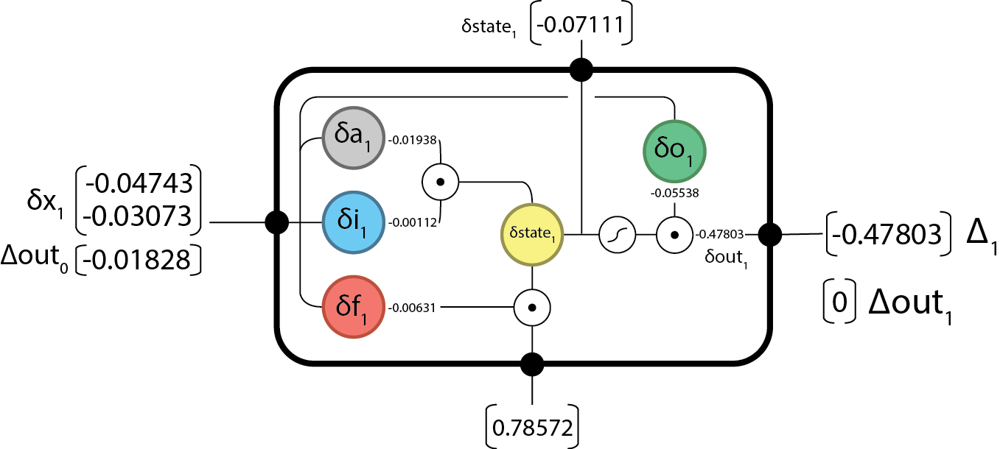

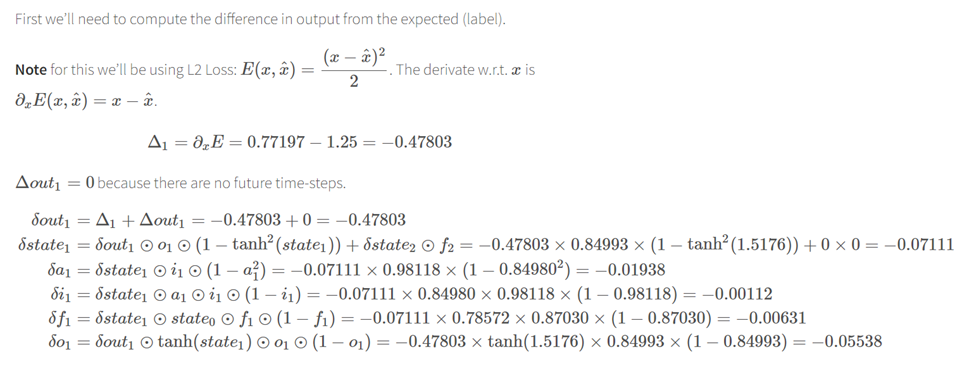

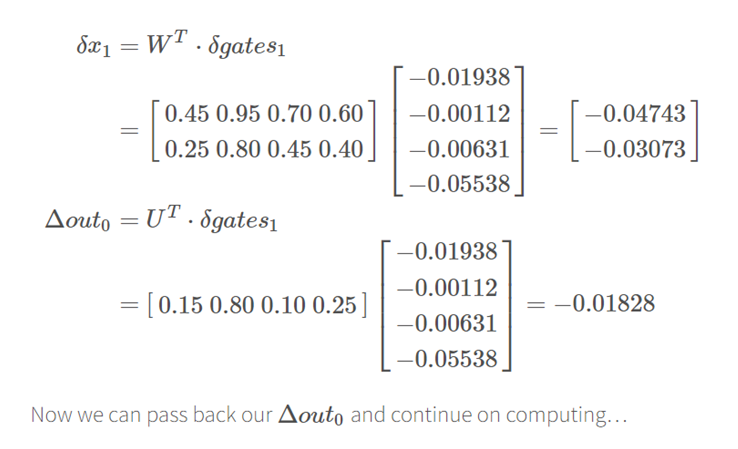

####Backward @ t=0
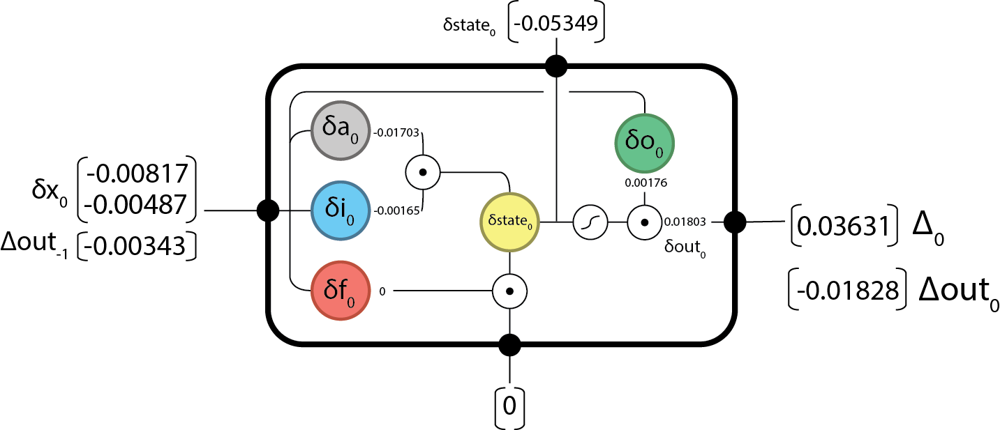

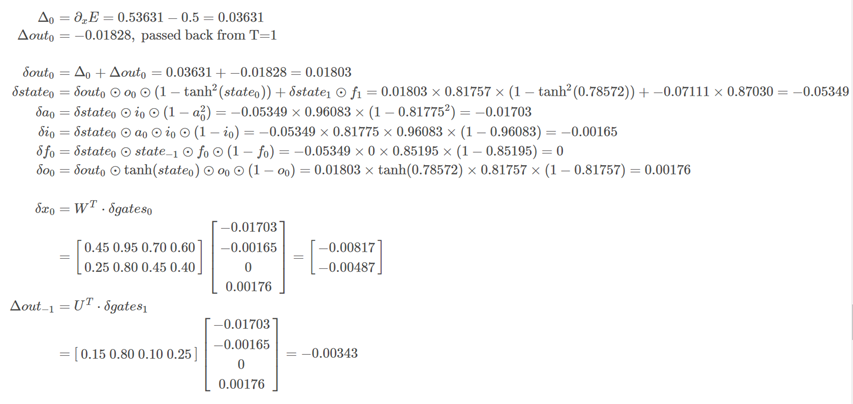

And we’re done the backward step!

Now we’ll need to update our internal parameters according to whatever solving algorithm you’ve chosen. I’m going to use a simple Stochastic Gradient Descent (SGD) update with learning rate: λ=0.1
.

We’ll need to compute how much our weights are going to change by:

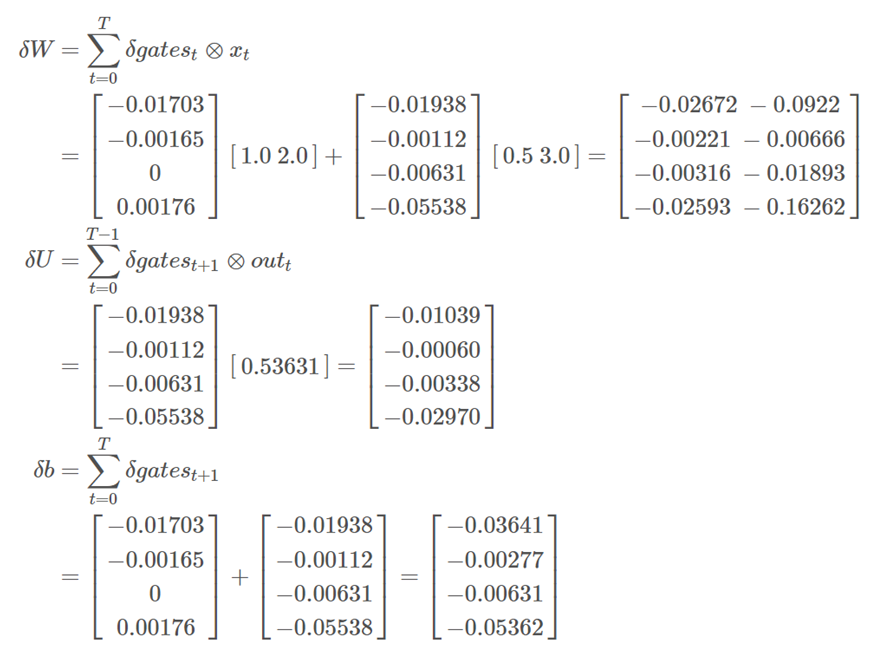

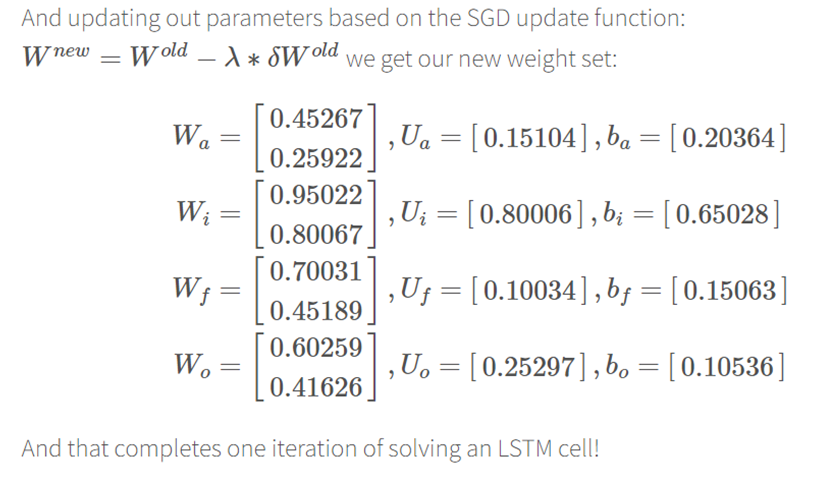

What are the benefits of LSTM in compare to RNN:

1. Mitigation of the Vanishing Gradient Problem

RNNs:

RNNs suffer from the vanishing gradient problem, where gradients used to update the network's weights diminish exponentially during backpropagation through time. This makes it difficult for RNNs to learn long-term dependencies, as the influence of earlier inputs diminishes as it propagates through the network.

LSTMs:

LSTMs are designed with special gates (input, forget, and output gates) that control the flow of information. The cell state, which flows through the network with minor linear interactions, helps preserve gradients over long sequences. This allows LSTMs to effectively learn long-term dependencies and mitigate the vanishing gradient problem.
2. Selective Memory and Information Flow

RNNs:

RNNs treat all inputs with equal importance and do not have mechanisms to selectively remember or forget information, making them less effective in handling sequences where some information is more critical than others.

LSTMs:

LSTMs use gates to control what information should be kept or discarded at each step. The forget gate decides which information to throw away, the input gate controls which information is added to the cell state, and the output gate determines the output from the current cell state. This selective memory enables LSTMs to retain relevant information and discard irrelevant information efficiently.
3. Handling Long-Term Dependencies

RNNs:

Due to the vanishing gradient problem, RNNs struggle to learn long-term dependencies, making them less effective for tasks that require understanding of context over long sequences.

LSTMs:

The ability to maintain a cell state and control information flow allows LSTMs to handle long-term dependencies better. This is particularly important in tasks such as language modeling, where understanding the context over long sentences or paragraphs is crucial.
4. Improved Training Stability

RNNs:

Training RNNs can be unstable due to exploding or vanishing gradients, leading to either very large weight updates (exploding gradients) or very small weight updates (vanishing gradients), both of which can hinder the learning process.

LSTMs:

LSTMs are designed to be more stable during training. The gating mechanisms help regulate the flow of gradients, reducing the risk of exploding or vanishing gradients and resulting in more stable and efficient training.
5. Performance on Sequential Tasks

RNNs:

While RNNs can perform well on short sequences, their performance degrades as the length of the sequence increases due to their inability to capture long-term dependencies effectively.

LSTMs:

LSTMs excel in tasks involving long sequences, such as speech recognition, language translation, time series prediction, and more. Their ability to capture long-term dependencies makes them more suitable for these tasks.

Sources:

- https://www.theaidream.com/post/introduction-to-rnn-and-lstm#:~:text=Long%20Short%2DTerm%20Memory(LSTM),-LSTM%20is%20an&text=Hence%20the%20RNN%20was%20redesigned,the%20long%2Dterm%20dependency%20problem.

- https://medium.com/@ottaviocalzone/an-intuitive-explanation-of-lstm-a035eb6ab42c

- https://blog.aidangomez.ca/2016/04/17/Backpropogating-an-LSTM-A-Numerical-Example/
- youtube video: 18- Long Short Term Memory (LSTM) Networks Explained Easily
- ChatGPT4

###**B.Codes**

#**1.Import libraries**

In [81]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [102]:
import keras
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import numpy as np
import random
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, GRU, Dropout, SimpleRNN
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt


from zipfile import ZipFile
import os

with ZipFile('/content/drive/MyDrive/810101540_Amir_NaddafFahmideh_P3/jena_climate_2009_2016.zip','r') as zipObj:
  zipObj.extractall('/content/drive/MyDrive/810101540_Amir_NaddafFahmideh_P3/RNN-LSTMN')



#**2.Import our data.**

In [83]:
csv_path = "/content/drive/MyDrive/810101540_Amir_NaddafFahmideh_P3/RNN-LSTMN/jena_climate_2009_2016.csv"

df = pd.read_csv(csv_path)

#**3. The next step is to delete all columns other than the temperature, as we are building a univariate model. Keeping only the temperature data.**

In [84]:
df = df[['T (degC)']]

#**4. We apply the min-max scaler.**

In [85]:
scaler = MinMaxScaler()
df = pd.DataFrame(scaler.fit_transform(df), columns = ['T'])

# **5. We prepare our data and convert the list of lists to numpy array.We need to split the data into a shape in which we have sequences of past data and sequences of future data. We want to predict 72 steps into the future, and we’ll use 3*72 steps into the past. This is an arbitrary choice. You can try out using more or less past data.**

In [ ]:
ylist = list(df['T'])

n_future = 72
n_past = 3*72
total_period = 4*72

idx_end = len(ylist)
idx_start = idx_end - total_period

X_new = []
y_new = []
while idx_start > 0:
  x_line = ylist[idx_start:idx_start+n_past]
  y_line = ylist[idx_start+n_past:idx_start+total_period]

  X_new.append(x_line)
  y_new.append(y_line)

  idx_start = idx_start - 1



X_new = np.array(X_new)
y_new = np.array(y_new)

#**6.We do train test split.**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X_new, y_new, test_size=0.10, random_state=42)

In [ ]:
X_train.shape

(378236, 216)

#**7.It takes a long time to run this model. The batch size of 2000 is provided for demonstration purposes. But you need to put a much smaller batch size. Note that The SimpleRNN layer needs an input format that is 3D, and the shape has to correspond to (n_samples, n_timesteps, n_features). This can be obtained using reshape.**

In [ ]:
batch_size = 500

n_samples = X_train.shape[0]
n_timesteps = X_train.shape[1]
n_steps = y_train.shape[1]
n_features = 1

X_train_rs = X_train.reshape(n_samples, n_timesteps, n_features )

X_test_rs = X_test.reshape(X_test.shape[0], n_timesteps, n_features )

#**8.We parameterize a small network with SimpleRNN.**
Line 1: -------
Line 2: -------
Line 3:-------

Model: "sequential_39"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn (SimpleRNN)      (None, 216, 8)            80        
                                                                 
 simple_rnn_1 (SimpleRNN)    (None, 216, 8)            136       
                                                                 
 simple_rnn_2 (SimpleRNN)    (None, 8)                 136       
                                                                 
 dense_117 (Dense)           (None, 72)                648       
                                                                 
Total params: 1000 (3.91 KB)
Trainable params: 1000 (3.91 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/5
152/152 [==============================] - 103s 616ms/step - loss: 0.0763 - mean_absolute_error: 0.0763 - val_loss: 0.0466 - val_mean_absolute_

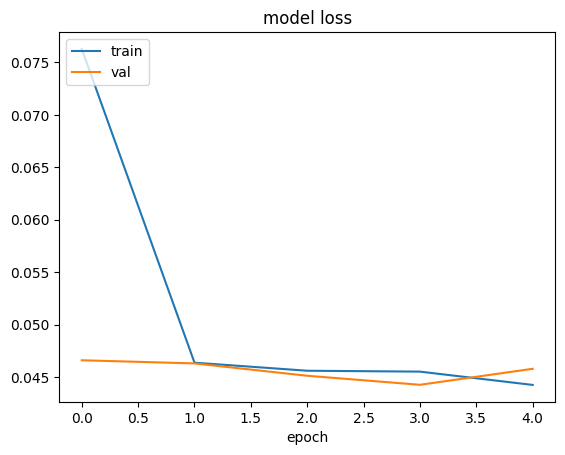

In [ ]:
random.seed(42)

simple_model = Sequential([
  SimpleRNN(8, activation='tanh',input_shape=(n_timesteps, n_features), return_sequences=True),
  SimpleRNN(8, activation='tanh', return_sequences = True),
  SimpleRNN(8, activation='tanh'),
  Dense(y_train.shape[1]),
])

simple_model.summary()

simple_model.compile(
  optimizer=tf.keras.optimizers.Adam(learning_rate=0.01),
  loss='mean_absolute_error',
  metrics=['mean_absolute_error'],
)

smod_history = simple_model.fit(X_train_rs, y_train,
          validation_split=0.2,
          epochs=5,
          batch_size=batch_size,
          shuffle = True
)

preds = simple_model.predict(X_test_rs)



plt.plot(smod_history.history['loss'])
plt.plot(smod_history.history['val_loss'])
plt.title('model loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
print(r2_score(preds, y_test))

0.6764472084021739


#Improved simple RNN:

we are going to improve our model by changing that we are using 4 * 50 past data to predict 50 future.

In [104]:
ylist_new = list(df['T'])

n_future_new = 50
n_past_new = 4*50
total_period_new = 5*50

idx_end = len(ylist_new)
idx_start = idx_end - total_period_new

X_New = []
y_New = []
while idx_start > 0:
  x_line = ylist_new[idx_start:idx_start+n_past_new]
  y_line = ylist_new[idx_start+n_past_new:idx_start+total_period_new]

  X_New.append(x_line)
  y_New.append(y_line)

  idx_start = idx_start - 1



X_New = np.array(X_New)
y_New = np.array(y_New)

In [93]:
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_New, y_New, test_size=0.10, random_state=42)

In [96]:
batch_size = 500

n_samples_new = X_train_new.shape[0]
n_timesteps_new = X_train_new.shape[1]
n_steps_new = y_train_new.shape[1]
n_features = 1

X_train_rsN = X_train_new.reshape(n_samples, n_timesteps_new, n_features )

X_test_rsN = X_test_new.reshape(X_test_new.shape[0], n_timesteps_new, n_features)

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 150, 50)           10400     
                                                                 
 dropout_6 (Dropout)         (None, 150, 50)           0         
                                                                 
 lstm_7 (LSTM)               (None, 150, 50)           20200     
                                                                 
 dropout_7 (Dropout)         (None, 150, 50)           0         
                                                                 
 lstm_8 (LSTM)               (None, 50)                20200     
                                                                 
 dropout_8 (Dropout)         (None, 50)                0         
                                                                 
 dense_1 (Dense)             (None, 50)               

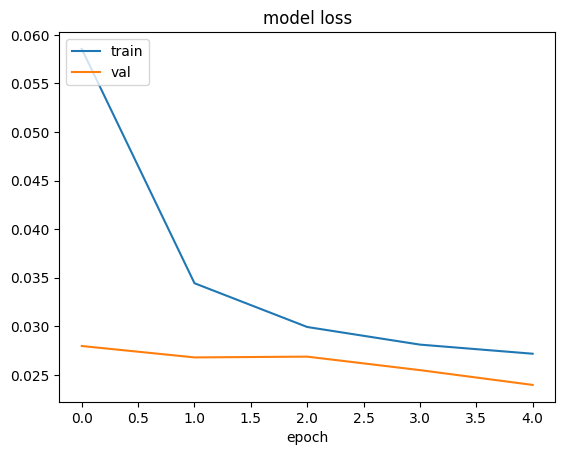

In [105]:
random.seed(42)

simple_model = Sequential([
  SimpleRNN(8, activation='tanh',input_shape=(n_timesteps_new, n_features), return_sequences=True),
  SimpleRNN(8, activation='tanh', return_sequences = True),
  SimpleRNN(8, activation='tanh'),
  Dense(y_train_new.shape[1]),
])

LSTM_model.summary()

LSTM_model.compile(
  optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
  loss='mean_absolute_error',
  metrics=['mean_absolute_error'],
)

model_history = LSTM_model.fit(X_train_rsN, y_train_new,
          validation_split=0.2,
          epochs=5,
          batch_size=batch_size,
          shuffle = True
)

preds = LSTM_model.predict(X_test_rsN)



plt.plot(model_history.history['loss'])
plt.plot(model_history.history['val_loss'])
plt.title('model loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [107]:
print(r2_score(preds, y_test_new))

0.9368875779567191


#**9.A simple architecture with 1 Gated Recurrent Unit (GRU) layer.**

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Model: "sequential_40"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 8)                 264       
                                                                 
 dense_118 (Dense)           (None, 72)                648       
                                                                 
Total params: 912 (3.56 KB)
Trainable params: 912 (3.56 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/5
152/152 [==============================] - 6s 25ms/step - loss: 0.0607 - mean_absolute_error: 0.0607 - val_loss: 0.0452 - val_mean_absolute_error: 0.0452
Epoch 2/5
152/152 [==============================] - 3s 20ms/step - loss: 0.0361 - mean_absolute_error: 0.0361 - val_loss: 0.0297 - val_mean_absolute_error: 0.0297
Epoch 3/5
152/152 [==============================] - 2s 16ms/step - loss: 0.0296 - mean_abs

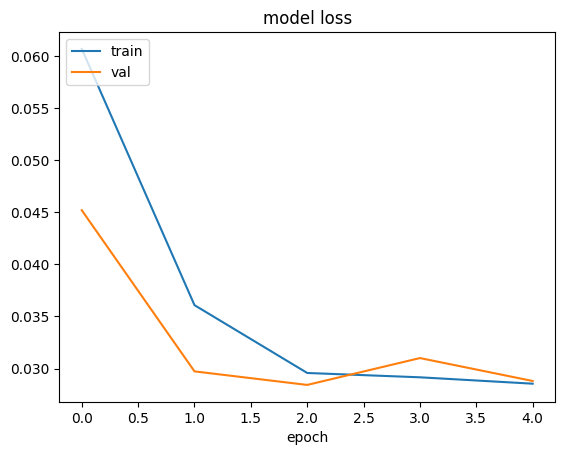

In [ ]:
random.seed(42)
from tensorflow.keras.layers import GRU

simple_model = Sequential([
   GRU(8, activation='tanh',input_shape=(n_timesteps, n_features)),
  Dense(y_train.shape[1]),
])

simple_model.summary()

simple_model.compile(
  optimizer=tf.keras.optimizers.Adam(learning_rate=0.1),
  loss='mean_absolute_error',
  metrics=['mean_absolute_error'],
)

smod_history = simple_model.fit(X_train_rs, y_train,
          validation_split=0.2,
          epochs=5,
          batch_size=batch_size,
          shuffle = True
)

preds = simple_model.predict(X_test_rs)



plt.plot(smod_history.history['loss'])
plt.plot(smod_history.history['val_loss'])
plt.title('model loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
print(r2_score(preds, y_test))

0.9143840600860125


#Improved GRU:

we are going to improve our model by increasing the number of units of each layer and also change the learning rate of Adam optimizer. We also add another GRU layer and made a more complex model and use dropout to prevent overfitting. I also used the new data which predicts 50 data in future by 4*50 data in the past.

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 150, 64)           12864     
                                                                 
 dropout_9 (Dropout)         (None, 150, 64)           0         
                                                                 
 gru_1 (GRU)                 (None, 32)                9408      
                                                                 
 dropout_10 (Dropout)        (None, 32)                0         
                                                                 
 dense_4 (Dense)             (None, 50)                1650      
                                                                 
Total params: 23922 (93.45 KB)
Trainable params: 23922 (93.45 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/5
606/606 

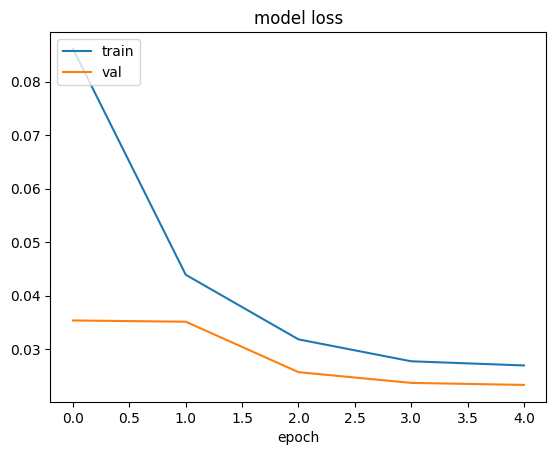

In [108]:
random.seed(42)
from tensorflow.keras.layers import GRU

simple_model = Sequential([
   GRU(64, activation='tanh', return_sequences=True, input_shape=(n_timesteps_new, n_features)),
   Dropout(0.2),
   GRU(32, activation='tanh'),
   Dropout(0.2),
   Dense(y_train_new.shape[1]),
])

simple_model.summary()

simple_model.compile(
  optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
  loss='mean_absolute_error',
  metrics=['mean_absolute_error'],
)

smod_history = simple_model.fit(X_train_rsN, y_train_new,
          validation_split=0.2,
          epochs=5,
          batch_size=batch_size,
          shuffle = True
)

preds = simple_model.predict(X_test_rsN)



plt.plot(smod_history.history['loss'])
plt.plot(smod_history.history['val_loss'])
plt.title('model loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [110]:
print(r2_score(preds, y_test_new))

0.9396011163458389


#**10.This is a  more complex network with three layers of Gated Recurrent Unit (GRU).**

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 216, 10)           390       
                                                                 
 gru_1 (GRU)                 (None, 216, 10)           660       
                                                                 
 gru_2 (GRU)                 (None, 10)                660       
                                                                 
 dense (Dense)               (None, 72)                792       
                                                                 
Total params: 2502 (9.77 KB)
Trainable params: 2502 (9.77 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/5
152/152 [==============================] - 230s 1s/step - loss: 0.1937 - mean_absolute_error: 0.1937 - val_loss: 0.0519 - val_mean_absolute_error:

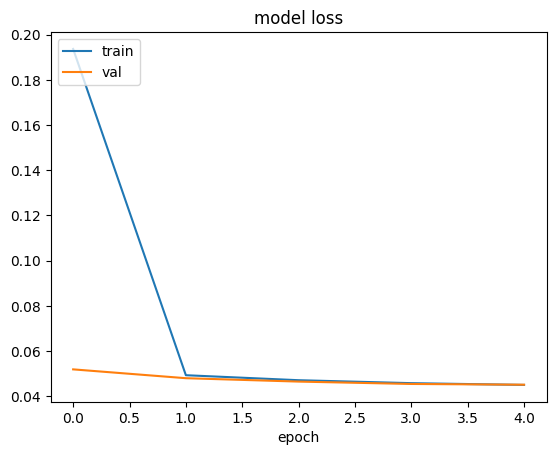

In [ ]:
random.seed(42)
from tensorflow.keras.layers import GRU

simple_model = Sequential([
   GRU(10, activation='tanh',input_shape=(n_timesteps, n_features), return_sequences=True),
    GRU(10, activation='tanh', return_sequences=True),
    GRU(10, activation='tanh'),
  Dense(y_train.shape[1]),
])

simple_model.summary()

simple_model.compile(
  optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
  loss='mean_absolute_error',
  metrics=['mean_absolute_error'],
)

smod_history = simple_model.fit(X_train_rs, y_train,
          validation_split=0.2,
          epochs=5,
          batch_size=batch_size,
          shuffle = True
)

preds = simple_model.predict(X_test_rs)



plt.plot(smod_history.history['loss'])
plt.plot(smod_history.history['val_loss'])
plt.title('model loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
print(r2_score(preds, y_test))

0.6824862553686698


#Improved GRU complex model:

we are going to improve our model by using the new data.

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_2 (GRU)                 (None, 150, 10)           390       
                                                                 
 gru_3 (GRU)                 (None, 150, 10)           660       
                                                                 
 gru_4 (GRU)                 (None, 10)                660       
                                                                 
 dense_5 (Dense)             (None, 50)                550       
                                                                 
Total params: 2260 (8.83 KB)
Trainable params: 2260 (8.83 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/5
606/606 [==============================] - 218s 351ms/step - loss: 0.0796 - mean_absolute_error: 0.0796 - val_loss: 0.0384 - val_mean_absolute_e

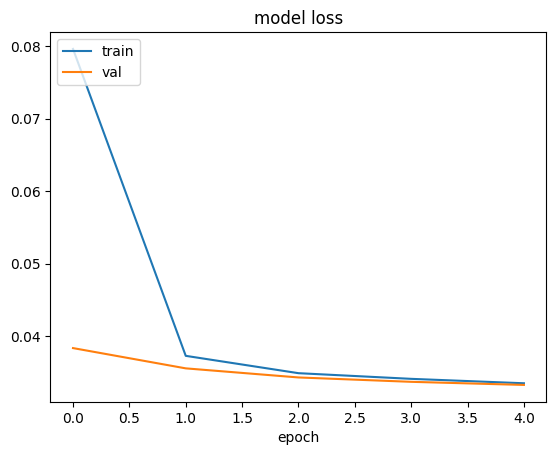

In [111]:
random.seed(42)
from tensorflow.keras.layers import GRU

simple_model = Sequential([
   GRU(10, activation='tanh',input_shape=(n_timesteps_new, n_features), return_sequences=True),
    GRU(10, activation='tanh', return_sequences=True),
    GRU(10, activation='tanh'),
  Dense(y_train_new.shape[1]),
])

simple_model.summary()

simple_model.compile(
  optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
  loss='mean_absolute_error',
  metrics=['mean_absolute_error'],
)

smod_history = simple_model.fit(X_train_rsN, y_train_new,
          validation_split=0.2,
          epochs=5,
          batch_size=batch_size,
          shuffle = True
)

preds = simple_model.predict(X_test_rsN)



plt.plot(smod_history.history['loss'])
plt.plot(smod_history.history['val_loss'])
plt.title('model loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [112]:
print(r2_score(preds, y_test_new))

0.8257392475374471


#**NOTE 2: In Part II, you must explain all the codes line by line. You should also improve the Train Score: 14.93 RMSE and Test Score: 46.19 RMSE of the model.**

#**Part II**
#**In this part, we will employ LSTM.This section uses the stock market data(SP500).**

#**1. Import libraries.**

In [ ]:
import pandas
import matplotlib.pyplot as plt
import numpy
import matplotlib.pyplot as plt
import pandas
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import numpy as np

# **2. We normalize the dataset and do train and test split.**

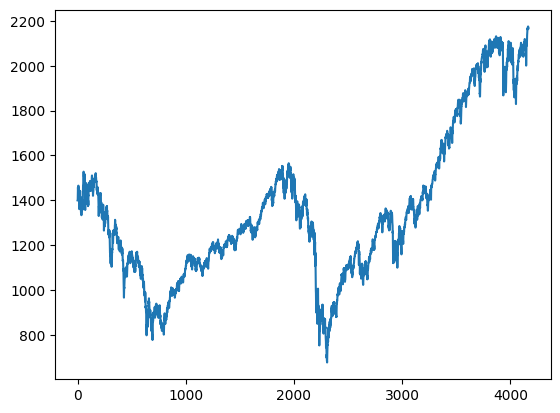

2791 1376


In [ ]:
dataset = pandas.read_csv('/content/drive/MyDrive/810101540_Amir_NaddafFahmideh_P3/sp500.csv', usecols=[0], engine='python', skipfooter=3)
plt.plot(dataset)
plt.show()

scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)

train_size = int(len(dataset) * 0.67)
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
print(len(train), len(test))

In [ ]:
print(dataset)

[[0.48240909]
 [0.48420417]
 [0.48509838]
 ...
 [0.99562893]
 [0.99609603]
 [0.99436106]]


# **3. We convert an array of values into a timeseries data.**

In [ ]:
def create_dataset(dataset, look_back=1):
	dataX, dataY = [], []
	for i in range(len(dataset)-look_back-1):
		a = dataset[i:(i+look_back), 0]
		dataX.append(a)
		dataY.append(dataset[i + look_back, 0])
	return np.array(dataX), np.array(dataY)

In [ ]:
look_back = 1
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)

In [ ]:
trainX.shape

(2789, 1)

# **4. We reshape input to be [samples, time steps, features].**

In [ ]:

trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))

# **5.We create and fit the LSTM network.**

In [ ]:
model = Sequential()
model.add(LSTM(4, input_shape=(1, look_back)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=100, batch_size=10, verbose=2)

Epoch 1/100
279/279 - 3s - loss: 0.0518 - 3s/epoch - 11ms/step
Epoch 2/100
279/279 - 1s - loss: 0.0110 - 753ms/epoch - 3ms/step
Epoch 3/100
279/279 - 1s - loss: 0.0083 - 792ms/epoch - 3ms/step
Epoch 4/100
279/279 - 1s - loss: 0.0053 - 810ms/epoch - 3ms/step
Epoch 5/100
279/279 - 1s - loss: 0.0027 - 619ms/epoch - 2ms/step
Epoch 6/100
279/279 - 1s - loss: 9.4316e-04 - 554ms/epoch - 2ms/step
Epoch 7/100
279/279 - 1s - loss: 2.9300e-04 - 574ms/epoch - 2ms/step
Epoch 8/100
279/279 - 1s - loss: 1.6701e-04 - 562ms/epoch - 2ms/step
Epoch 9/100
279/279 - 1s - loss: 1.5436e-04 - 577ms/epoch - 2ms/step
Epoch 10/100
279/279 - 1s - loss: 1.5254e-04 - 568ms/epoch - 2ms/step
Epoch 11/100
279/279 - 1s - loss: 1.5112e-04 - 562ms/epoch - 2ms/step
Epoch 12/100
279/279 - 1s - loss: 1.4970e-04 - 569ms/epoch - 2ms/step
Epoch 13/100
279/279 - 1s - loss: 1.4652e-04 - 555ms/epoch - 2ms/step
Epoch 14/100
279/279 - 1s - loss: 1.4534e-04 - 568ms/epoch - 2ms/step
Epoch 15/100
279/279 - 1s - loss: 1.4449e-04 - 554m

#**6.We rescale predicted values and compute the root mean squared error.**

In [ ]:
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)

trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))

43/43 [==============================] - 0s 2ms/step
Train Score: 15.20 RMSE
Test Score: 44.03 RMSE


# **7. We shift train and test predictions for plotting and plot baseline and predictions.The part in orange is the training data, the part in blue is the test data, and the part in green is the predicted output.**

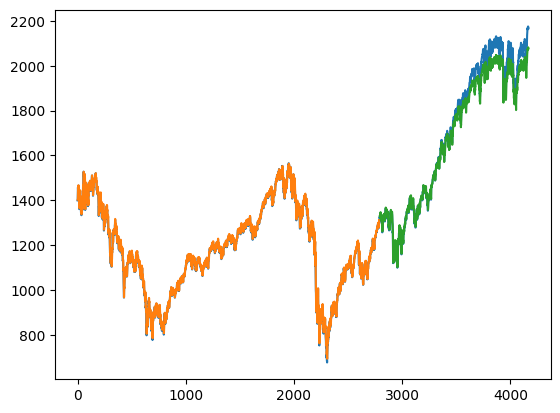

In [ ]:
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict


testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


plt.plot(scaler.inverse_transform(dataset))
plt.plot(trainPredictPlot)
plt.plot(testPredictPlot)
plt.show()

Improve the model by changing look back into 5 and also changing the number of units in the layer.

In [ ]:
look_back = 5
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)

In [ ]:
trainX.shape

(2785, 5)

In [ ]:
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))

In [ ]:
model = Sequential()
model.add(LSTM(50, input_shape=(1, look_back)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=100, batch_size=10, verbose=2)

Epoch 1/100
279/279 - 3s - loss: 0.0137 - 3s/epoch - 11ms/step
Epoch 2/100
279/279 - 1s - loss: 3.6942e-04 - 803ms/epoch - 3ms/step
Epoch 3/100
279/279 - 1s - loss: 2.2033e-04 - 848ms/epoch - 3ms/step
Epoch 4/100
279/279 - 1s - loss: 2.1119e-04 - 851ms/epoch - 3ms/step
Epoch 5/100
279/279 - 1s - loss: 2.0379e-04 - 751ms/epoch - 3ms/step
Epoch 6/100
279/279 - 1s - loss: 1.9630e-04 - 606ms/epoch - 2ms/step
Epoch 7/100
279/279 - 1s - loss: 1.8520e-04 - 629ms/epoch - 2ms/step
Epoch 8/100
279/279 - 1s - loss: 1.8183e-04 - 631ms/epoch - 2ms/step
Epoch 9/100
279/279 - 1s - loss: 1.7573e-04 - 607ms/epoch - 2ms/step
Epoch 10/100
279/279 - 1s - loss: 1.6494e-04 - 618ms/epoch - 2ms/step
Epoch 11/100
279/279 - 1s - loss: 1.6033e-04 - 604ms/epoch - 2ms/step
Epoch 12/100
279/279 - 1s - loss: 1.5184e-04 - 611ms/epoch - 2ms/step
Epoch 13/100
279/279 - 1s - loss: 1.5108e-04 - 600ms/epoch - 2ms/step
Epoch 14/100
279/279 - 1s - loss: 1.4354e-04 - 600ms/epoch - 2ms/step
Epoch 15/100
279/279 - 1s - loss: 1

In [ ]:
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)

trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

trainScore = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))

43/43 [==============================] - 0s 2ms/step
Train Score: 15.26 RMSE
Test Score: 22.35 RMSE


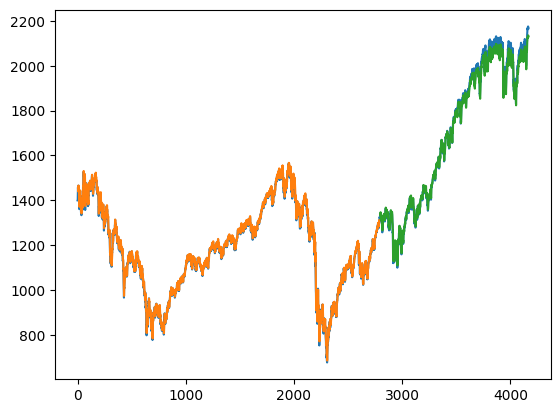

In [ ]:
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict


testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


plt.plot(scaler.inverse_transform(dataset))
plt.plot(trainPredictPlot)
plt.plot(testPredictPlot)
plt.show()

##**Part III**

###A.Example of sequence of tree processing using A* search

A* works by making a lowest-cost path tree from the start node to the target node. What makes A* different and better for many searches is that for each node, A* uses a function f(n) that gives an estimate of the total cost of a path using that node. Therefore, A* is a heuristic function, which differs from an algorithm in that a heuristic is more of an estimate and is not necessarily provably correct.

A* expands paths that are already less expensive by using this function:

f(n)=g(n)+h(n),

where

f(n) = total estimated cost of path through node

g(n) = cost so far to reach node

h(n) = estimated cost from
n to goal. This is the heuristic part of the cost function, so it is like a guess.

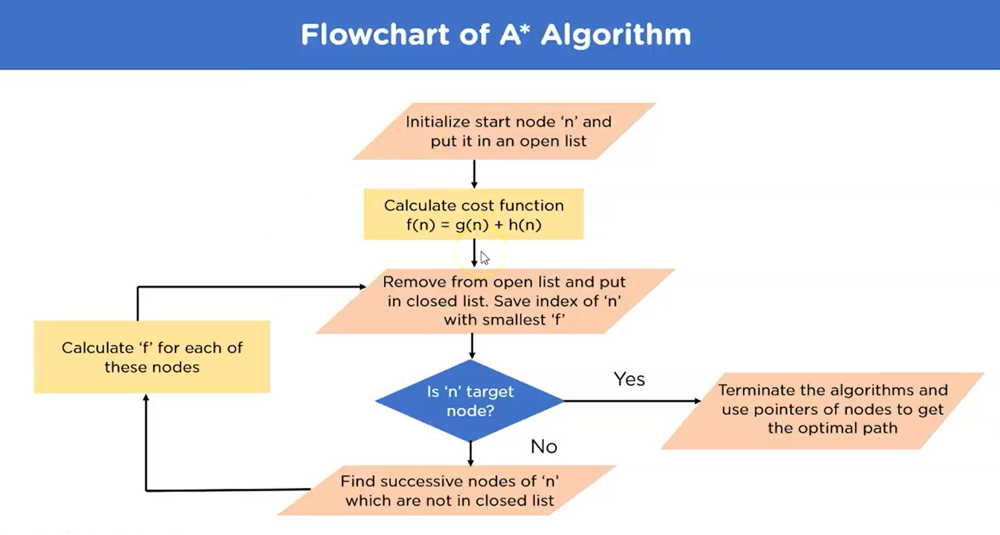

Problem 1:


This example comes from youtube channel: A Star algorithm | Example | Informed search | Artificial intelligence | Lec-21 | Bhanu Priya

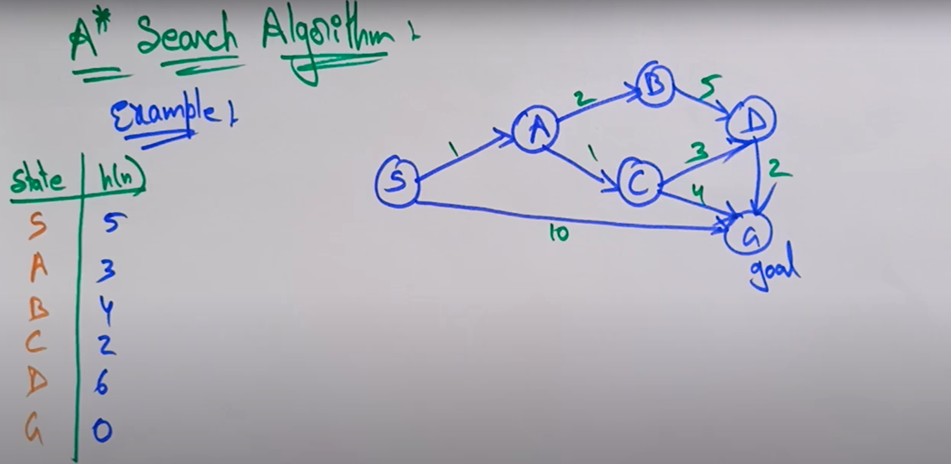

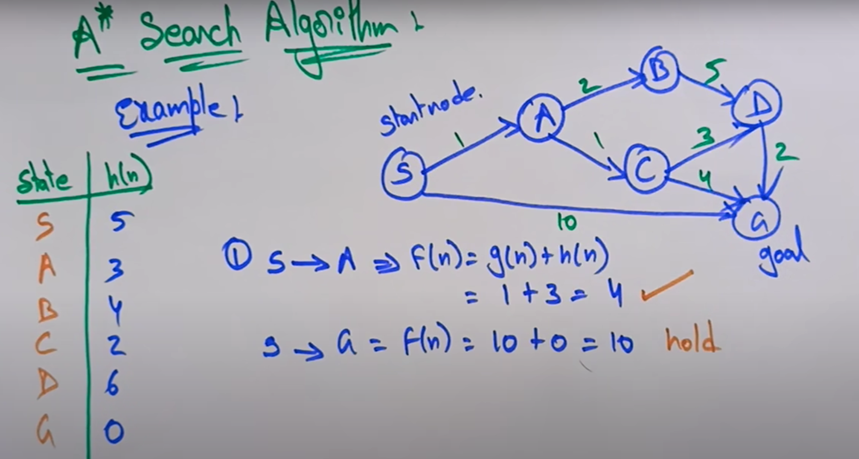

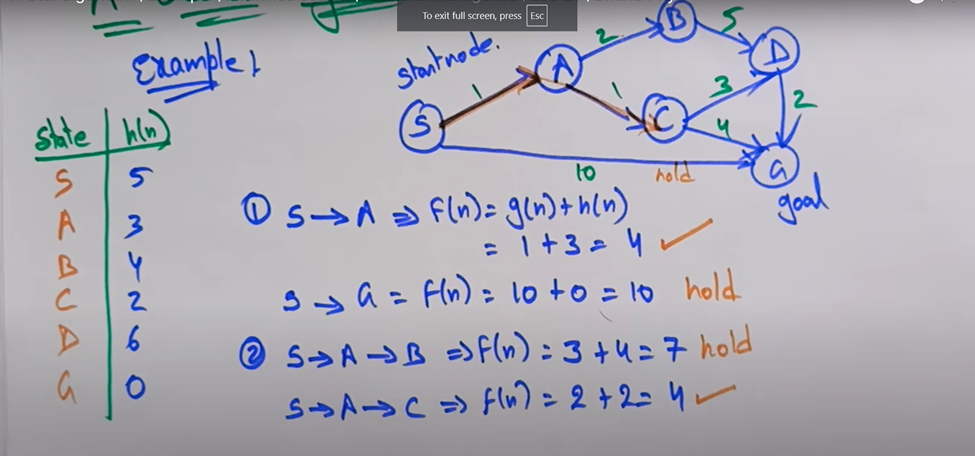

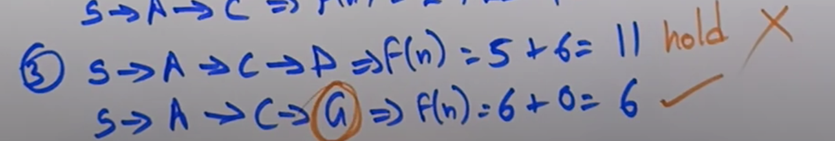

So the path would be S to A to C to G and it costs 6

code

Using this code for A* search

In [ ]:
import heapq

def a_star_search(graph, heuristics, start, goal):
    pq = [(heuristics[start], start)]
    g_costs = {start: 0}
    fathers = {start: None}

    while pq:
        _, current = heapq.heappop(pq)

        if current == goal:
            path = []
            while current:
                path.append(current)
                current = fathers[current]
            path.reverse()
            return path

        for neighbor, cost in graph[current].items():
            new_cost = g_costs[current] + cost

            if neighbor not in g_costs or new_cost < g_costs[neighbor]:
                g_costs[neighbor] = new_cost
                priority = new_cost + heuristics[neighbor]
                heapq.heappush(pq, (priority, neighbor))
                fathers[neighbor] = current

    return None

In [ ]:
graph = {
    'S': {'A': 1, 'G':10},
    'A': {'B': 2, 'C': 1},
    'B': {'D': 5},
    'C': {'D': 3, 'G': 4},
    'D': {'G': 2},
    'G': {}
}

heuristics = {
    'S': 5,
    'A': 3,
    'B': 4,
    'C': 2,
    'D': 6,
    'G': 0
}

start = 'S'
goal = 'G'
path = a_star_search(graph, heuristics, start, goal)

In [ ]:
for n in path:
  if n != goal:
    print(f'{n}->', end='')
  else:
    print(n)

S->A->C->G


Problem 2:

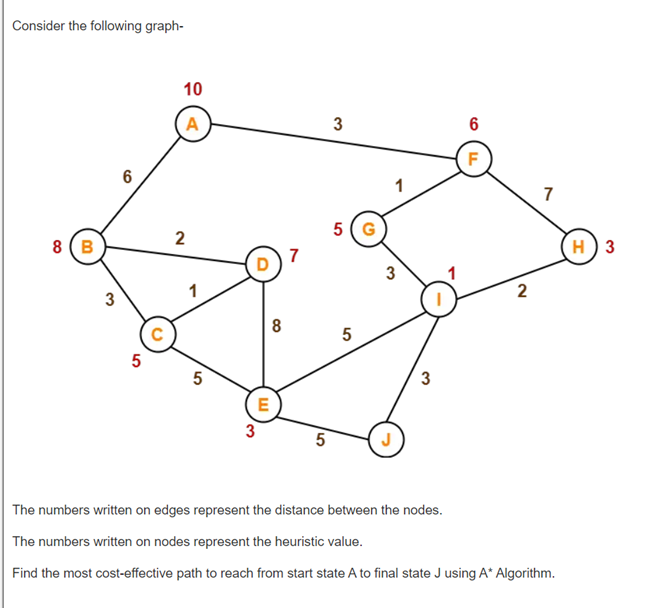

Source: https://www.gatevidyalay.com/a-algorithm-a-algorithm-example-in-ai/

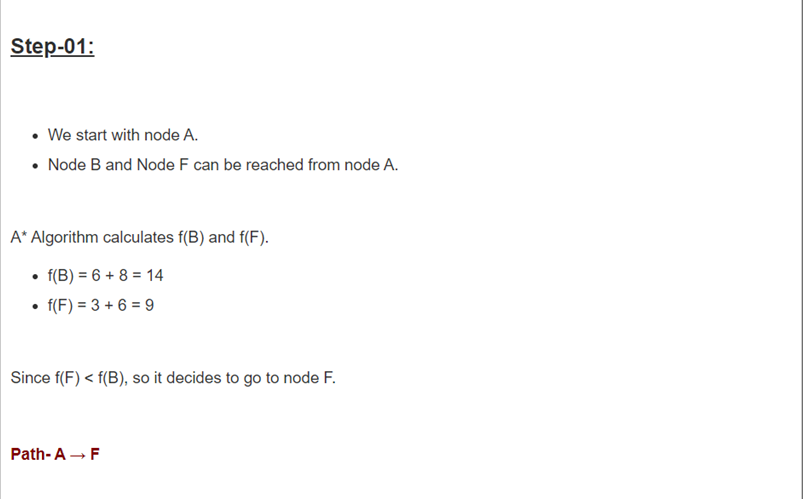

Source: https://www.gatevidyalay.com/a-algorithm-a-algorithm-example-in-ai/

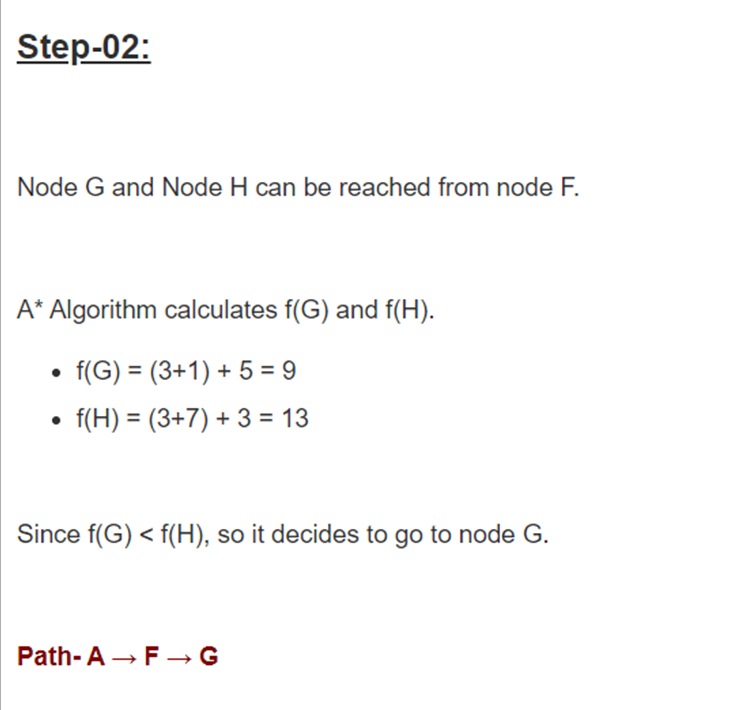

Source: https://www.gatevidyalay.com/a-algorithm-a-algorithm-example-in-ai/

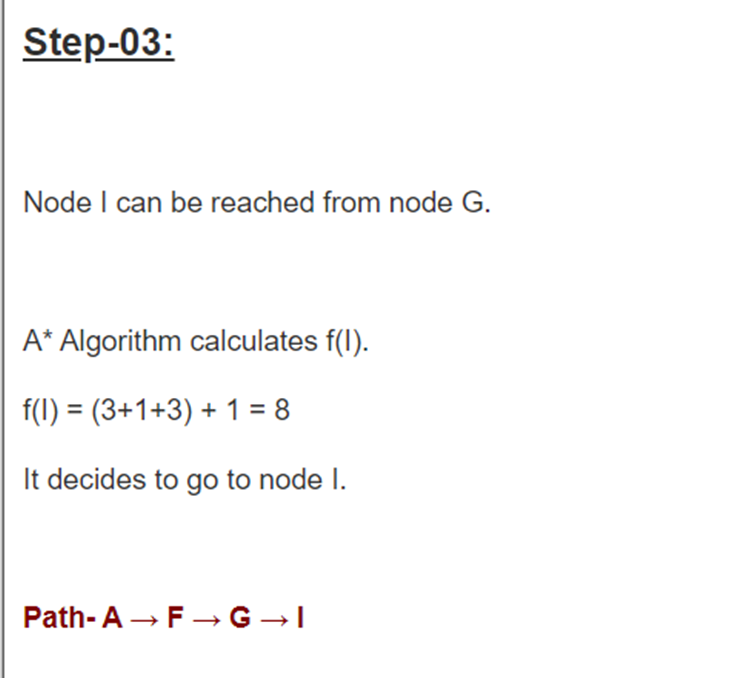

Source: https://www.gatevidyalay.com/a-algorithm-a-algorithm-example-in-ai/

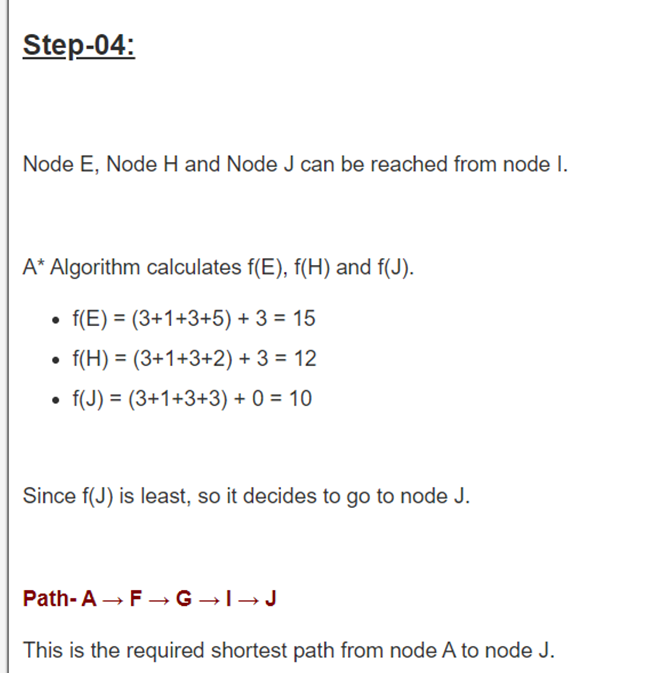

Source: https://www.gatevidyalay.com/a-algorithm-a-algorithm-example-in-ai/

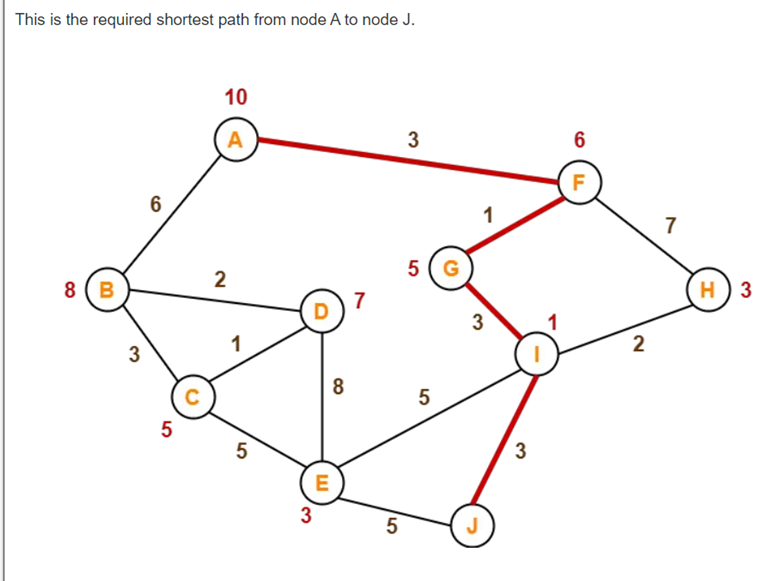

Source: https://www.gatevidyalay.com/a-algorithm-a-algorithm-example-in-ai/

Code

Building graph and heuristics and pass it as an input to the function.

In [ ]:
graph = {
    'A': {'B': 6, 'F': 3},
    'B': {'A': 6, 'C': 3, 'D': 2},
    'C': {'B': 3, 'D': 1, 'E': 5},
    'D': {'B': 2, 'E': 8, 'C': 1},
    'E': {'C': 5, 'D': 8, 'I': 5, 'J': 5},
    'F': {'A': 3, 'G': 1, 'H': 7},
    'G': {'F': 1, 'I': 3},
    'H': {'F': 7, 'I': 2},
    'I': {'E': 5, 'G': 3, 'H': 2, 'J': 3},
    'J': {'E': 5, 'I': 3}
}

heuristics = {
    'A': 10,
    'B': 8,
    'C': 5,
    'D': 7,
    'E': 3,
    'F': 6,
    'G': 5,
    'H': 3,
    'I': 1,
    'J': 0
}

start = 'A'
goal = 'J'
path = a_star_search(graph, heuristics, start, goal)

Printing the answer

In [ ]:
for n in path:
  if n != goal:
    print(f'{n}->', end='')
  else:
    print(n)

A->F->G->I->J


###B.Min-max search

#### Steps of the Minimax Algorithm

Steps of the Minimax Algorithm

1. Generate the Game Tree: Create a tree representing all possible moves from the current game state to the end of the game.

2. Assign Scores to Leaf Nodes: At the terminal nodes (leaf nodes), assign a score based on the outcome of the game from the perspective of the maximizer (+1 for a win, 0 for a tie, -1 for a loss).

3. Backpropagate Scores: Starting from the leaf nodes, propagate the scores back to the root. The maximizer will choose the move with the maximum score at its nodes, while the minimizer will choose the move with the minimum score at its nodes.

4. Optimal Move: The root node, which represents the current game state, will now have the optimal move for the maximizer based on the propagated scores.

I got this example from https://people.csail.mit.edu/rivest/pubs/Riv87c.pdf

Lets say we have this as our game tree

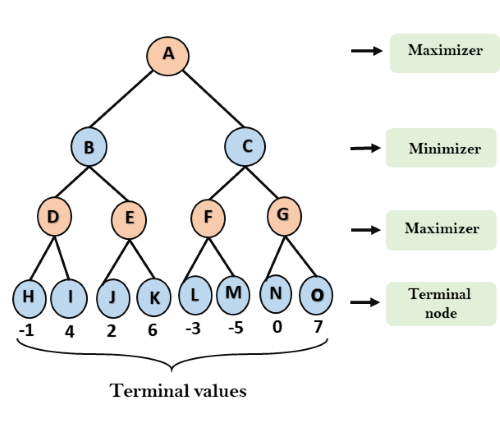

So we start from nodes and find the value of each node by going up and considering it's a maximizer level or minimizer.

- D = max(H, I) = max(-1, 4) = 4
- E = max(J, K) = max(2, 6) = 6
- F = max(L, M) = max(-3, -5) = -3
- G = max(N, O) = max(0, 7) = 7


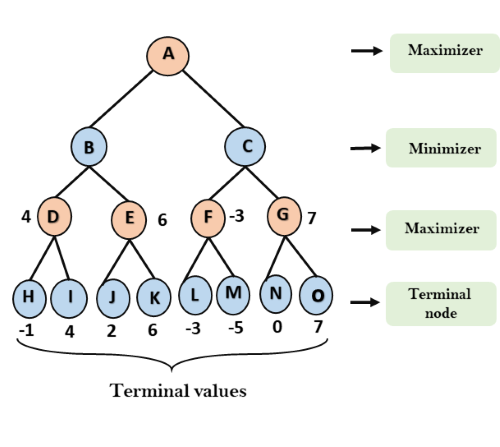

Now lets calculate value of B and C nodes. It is a Minimizer level so:

- B = min(D, E) = min(4, 6) = 4
- C = min(F, G) = min(-3, 7) = -3

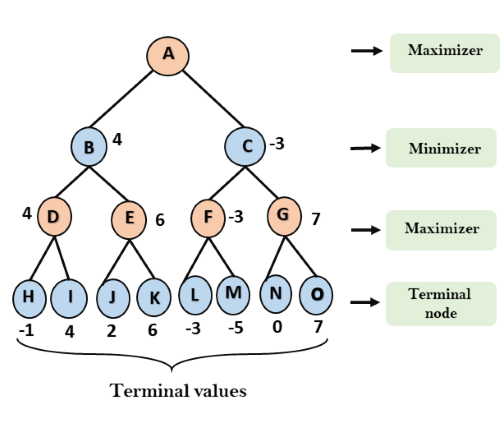

Now it's time for calculating the root value. It is a maximizer level:

- A = max(B, C) = max(4, -3) = 4

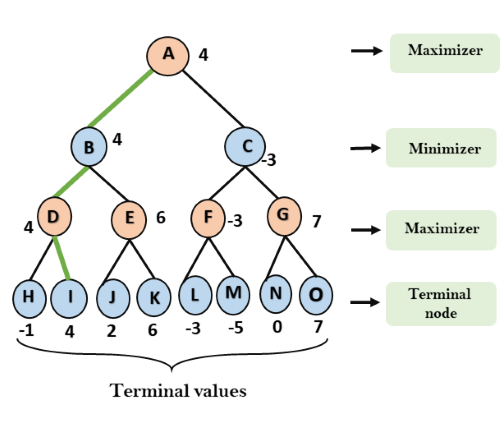

Code:

Lets start with the minimax function.

In [5]:

def minimax(node, depth, is_maximizing_player):
    if depth == 0 or not node.children:
        return node.value

    if is_maximizing_player:
        max_eval = float('-inf')
        for child in node.children:
            eval = minimax(child, depth - 1, False)
            max_eval = max(max_eval, eval)
        node.value = max_eval
        return max_eval
    else:
        min_eval = float('inf')
        for child in node.children:
            eval = minimax(child, depth - 1, True)
            min_eval = min(min_eval, eval)
        node.value = min_eval
        return min_eval


Now we need a Node class to save our tree nodes.

In [11]:

class Node:
    def __init__(self, value=None, children=None):
        self.value = value
        self.children = children if children is not None else []


H = Node(-1)
I = Node(4)
J = Node(2)
K = Node(6)
L = Node(-3)
M = Node(-5)
N = Node(0)
O = Node(7)

D = Node(children = [H, I])
E = Node(children = [J, K])
F = Node(children = [L, M])
G = Node(children = [N, O])

B = Node(children = [D, E])
C = Node(children = [F, G])

A = Node(children = [B, C])

In [12]:
optimal_value = minimax(A, depth=3, is_maximizing_player=True)

print(f"Optimal value for the maximizing player is: {optimal_value}")

Optimal value for the maximizing player is: 4


Problem 2

Lets say this time we have this tree

The problem is from youtube channel 1. MiniMax Search Algorithm Solved Example | Min Max Search Artificial Intelligence by Mahesh Huddar

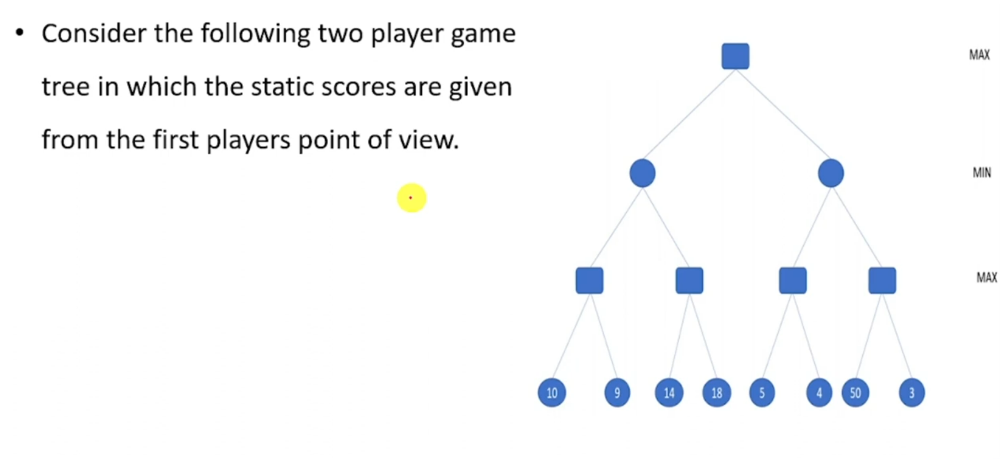


So if we do the algorithm for this tree we have:

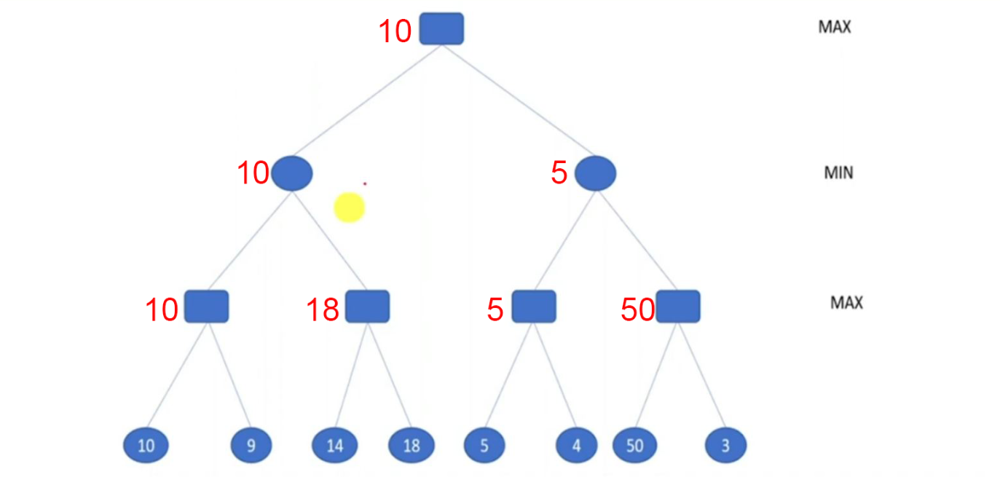

Code:

we first define our tree

In [13]:
H = Node(10)
I = Node(9)
J = Node(14)
K = Node(18)
L = Node(5)
M = Node(4)
N = Node(50)
O = Node(3)

D = Node(children = [H, I])
E = Node(children = [J, K])
F = Node(children = [L, M])
G = Node(children = [N, O])

B = Node(children = [D, E])
C = Node(children = [F, G])

A = Node(children = [B, C])

Then calculate the optimal value

In [14]:
optimal_value = minimax(A, depth=3, is_maximizing_player=True)

print(f"Optimal value for the maximizing player is: {optimal_value}")

Optimal value for the maximizing player is: 10


###C.Depth First Search (DFS), Breadth First Search (BFS), and Uniform Cost Search (UCS)


####DFS and BFS Example


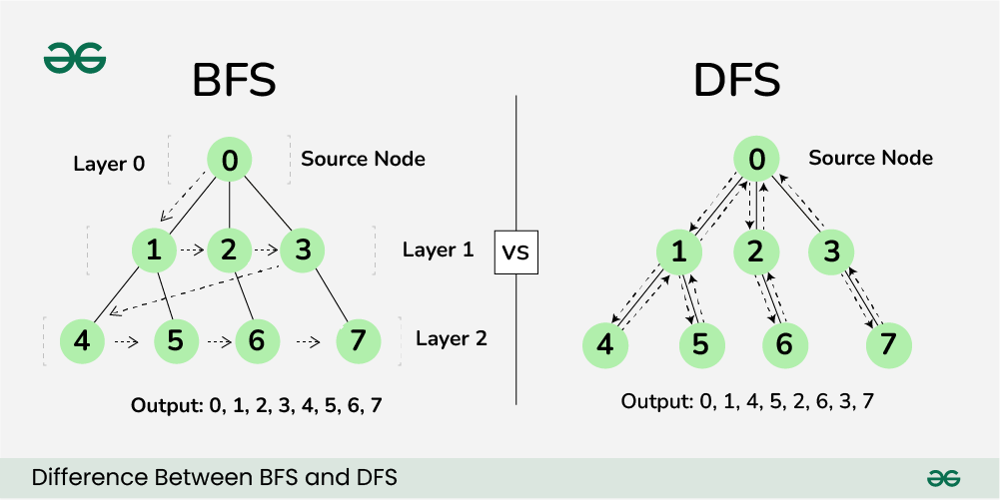

Source:https://www.geeksforgeeks.org/difference-between-bfs-and-dfs/

So as you can see in BFS we start from the root node and then we start to visit all its adjecents. When we did that is time to visit the first adjecent of root's adjecents, then the second one and goes on. We can say it starts from root and search level by level to the leaves. (better explanation in video)

At first we visit 0 and then we visit 1, 2, 3 in order, then visit 4, 5 and after that 6 and then 7.

But In the DFS we start from root and we go as far as its possible. Then when we get to a deadend we come back and try to explore another nodes which aren't visited.

At first we visit 0 and then we go to its first adjecent and down and down so we will visit 1, 4. Then 4 doesn't have any children so we come back into 1 and try the other path which leads us to 5. After that 5 doesn't have any children so we come up to 1 and 1 doesn't have any unexplored ways so we come back to 0 and story goes on so we will see 0 1 4 5 2 6 3 7 in order




Code:



DFS function is defined here:
(assuming graph is a connected graph)

In [16]:
def DFS(node, visited):
    if node not in visited:
      visited.append(node)
      for n in graph[node]:
        DFS(n, visited)
    return visited

Testing DFS on the graph

In [19]:
graph = {
    '0': ['1', '2', '3'],
    '1': ['4', '5'],
    '2': ['6'],
    '3': ['7'],
    '4': ['1'],
    '5': ['1'],
    '6': ['2'],
    '7': ['3']
}

visited = []

path = DFS('0', visited)

for n in path:
  print(f'{n}')

0
1
4
5
2
6
3
7


Lets define BFS function.

In [26]:
def BFS(root):
  visited = []
  queue = [root]
  while len(queue) != 0:
    node = queue[0]
    queue.remove(node)
    if node not in visited:
      visited.append(node)
      for n in graph[node]:
        queue.append(n)
    print(queue) #for explanation
  return visited

This is the test of our BFS function

In [27]:
graph = {
    '0': ['1', '2', '3'],
    '1': ['4', '5'],
    '2': ['6'],
    '3': ['7'],
    '4': ['1'],
    '5': ['1'],
    '6': ['2'],
    '7': ['3']
}

path = BFS('0')

for n in path:
  print(f'{n}')

['1', '2', '3']
['2', '3', '4', '5']
['3', '4', '5', '6']
['4', '5', '6', '7']
['5', '6', '7', '1']
['6', '7', '1', '1']
['7', '1', '1', '2']
['1', '1', '2', '3']
['1', '2', '3']
['2', '3']
['3']
[]
0
1
2
3
4
5
6
7


####Uniform Cost Search (UCS)

It is just like the A* algorithm but h(n) for all n is 0. So it just acts baced on g(n). (f(n) = g(n))

I got this example from https://plainenglish.io/blog/uniform-cost-search-ucs-algorithm-in-python-ec3ee03fca9f

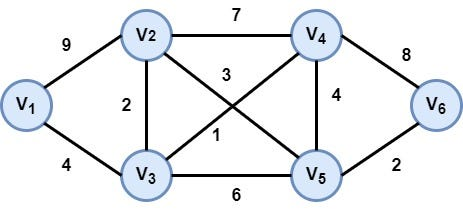

So we are in V1 and the goal is V6 so we start from V1 and put it into opened list. Then we move it into the closed list and add it's adjecents. After that we use the lowest cost adjecent and do the same for it. If we found a better way for a node we will omit the last way for that node and add this new one.
The next pictures are the step by step solution to the problem.

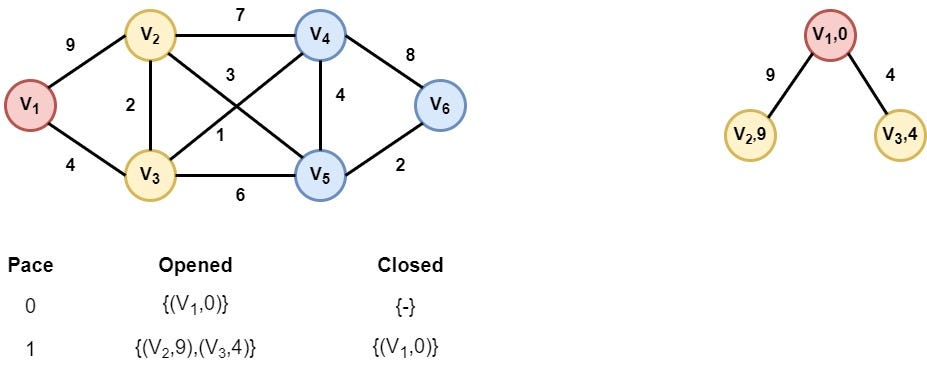

The V1 is selected as it is the only node in the opened list. Its children V2 and V3 are appended in the opened list after the distance calculation from node V1.

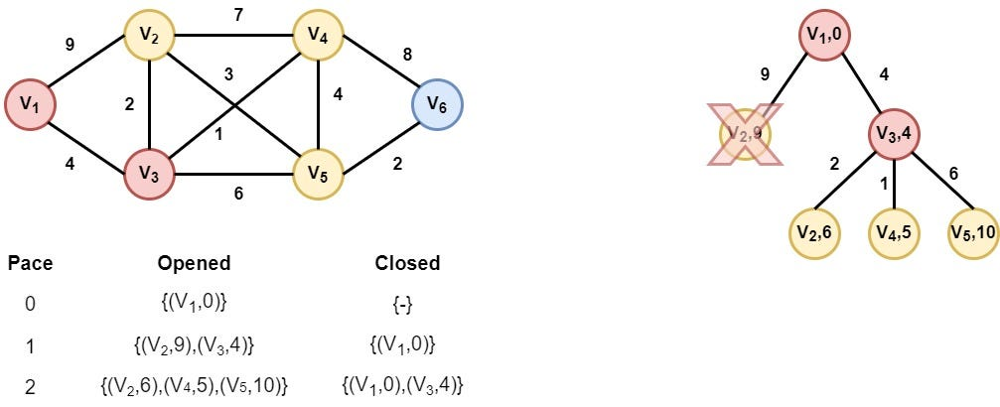

Node V3 is selected as it has the smallest distance value. As we can see, extending the node V3 we find the node V2 with a smaller distance value. So we replace node (V2,9) with the new node (V2,6).

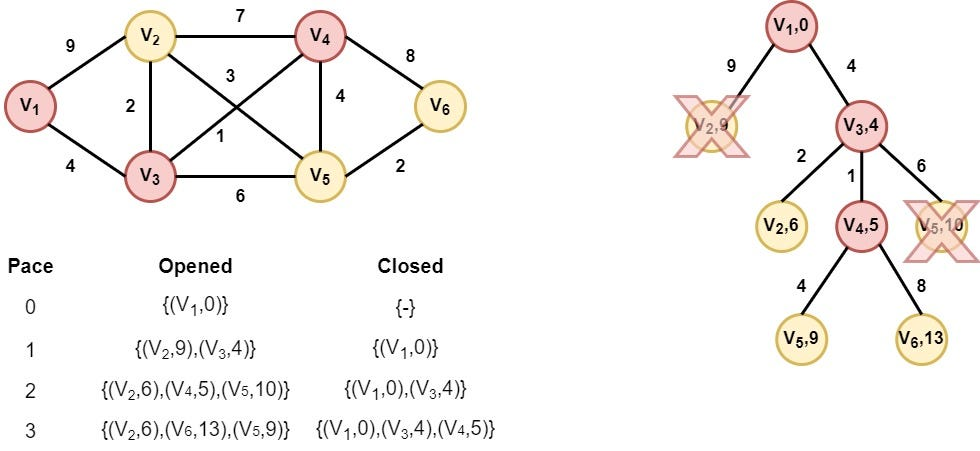

Node V4 is selected as it has the smallest distance value. In this step, we find a better distance value for node V5, so we replace the node (V5, 10) with node (V5, 9).

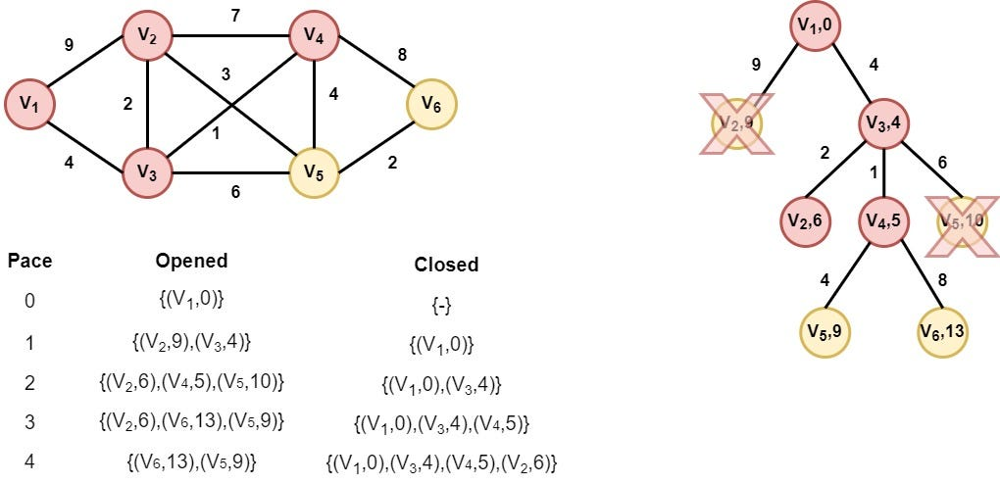

Node V2 is selected as it has the smallest distance value. However, none of its children is appended in the opened list, as nodes V3 and V4 are already inserted in the closed list and the algorithm doesn't find a better distance value for node V5.

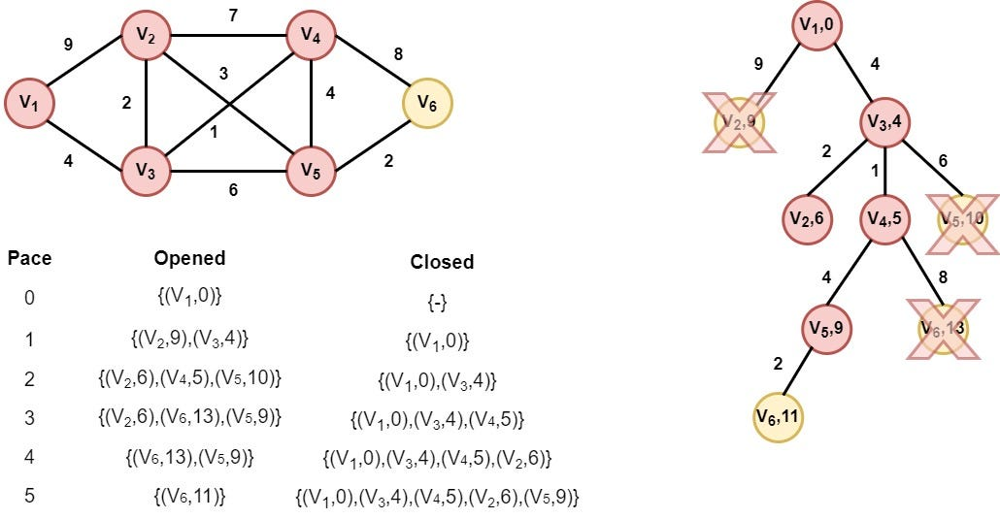

Node V5 is selected as it has the smallest distance value. A better path to node V6 is found in this step. So, we replace the old node (V6, 13) with node (V6, 11)

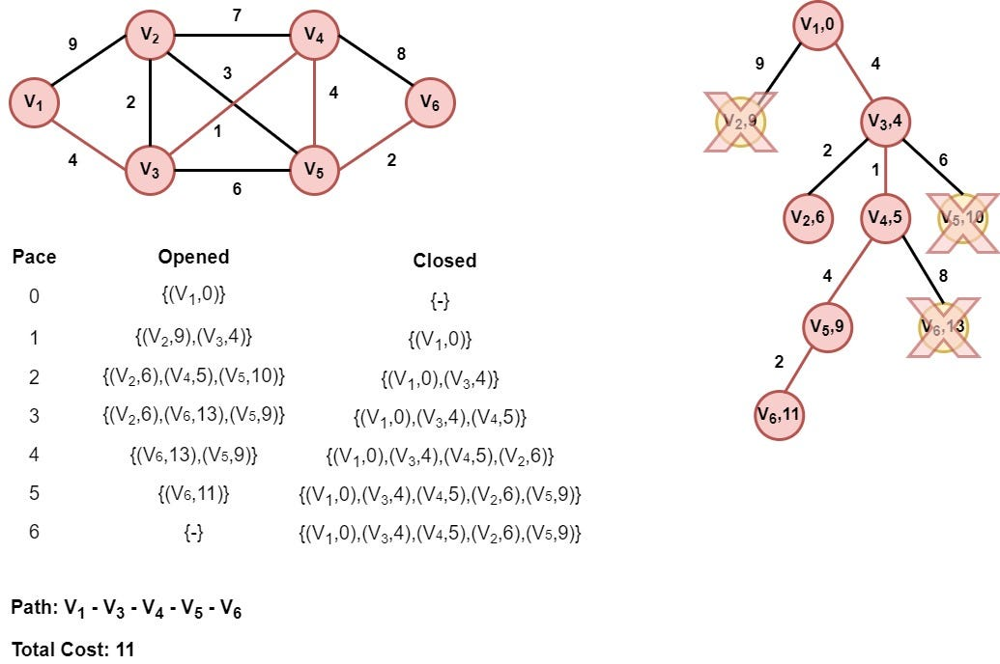

Node V6 (target node) is selected. So the algorithm returns the path from node V1 to node V6 with cost 11, which constitutes the best solution.

Code:
Build UCS function using A* function

In [28]:
import heapq

def UCS(graph , start, goal):
    pq = [(0, start)]
    g_costs = {start: 0}
    fathers = {start: None}

    while pq:
        _, current = heapq.heappop(pq)

        if current == goal:
            path = []
            while current:
                path.append(current)
                current = fathers[current]
            path.reverse()
            return path

        for neighbor, cost in graph[current].items():
            new_cost = g_costs[current] + cost

            if neighbor not in g_costs or new_cost < g_costs[neighbor]:
                g_costs[neighbor] = new_cost
                priority = new_cost
                heapq.heappush(pq, (priority, neighbor))
                fathers[neighbor] = current

    return None

Make our graph with adjency matrice and test the function.

In [31]:
graph = {
    'V1': {'V2': 9, 'V3': 4},
    'V2': {'V1': 9, 'V3': 2, 'V4': 7, 'V5': 3},
    'V3': {'V1': 4, 'V2': 2, 'V4': 1, 'V5': 6},
    'V4': {'V2': 7, 'V3': 1, 'V5': 4, 'V6': 8},
    'V5': {'V2': 3, 'V3': 6, 'V4': 4, 'V6': 2},
    'V6': {'V4': 8, 'V5': 2},
}


start = 'V1'
goal = 'V6'
path = UCS(graph, start, goal)

Print the result

In [32]:
for n in path:
  if n != goal:
    print(f'{n}->', end='')
  else:
    print(n)

V1->V3->V4->V5->V6


####D.simple constraint satisfaction problem

The goal is that as you can see in the picture, the goal is to color with four colors so that no adjacent regions have the same color

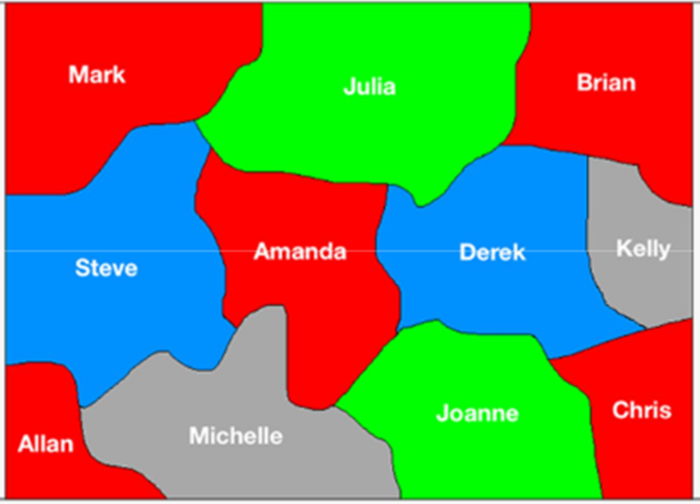

First install simpleai

In [33]:
pip install simpleai

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.4/94.4 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for simpleai: filename=simpleai-0.8.3-py3-none-any.whl size=100985 sha256=1585858d10cad3a6d8ff9c4c096bb3bb2df1af9a33b4f6c0c5cfded56e0f8e76
  Stored in directory: /root/.cache/pip/wheels/91/0c/38/421d7910e7bc59b97fc54f490808bdb1097607d83d1a592865
Successfully built simpleai


Then we import the libarary

In [74]:
from simpleai.search import CspProblem, min_conflicts

Define the constraint function so if the values where different it returns true

In [57]:
def constraint_func(names, values):
    return values[0] != values[1]

Describe the graph by adjecent matrice (here dict).

In [58]:
regions = {
    'Mark': ['Julia', 'Steve'],
    'Julia': ['Mark', 'Steve', 'Amanda', 'Derek', 'Brian'],
    'Steve': ['Mark', 'Julia', 'Amanda', 'Michelle', 'Allan'],
    'Allan': ['Steve', 'Michelle'],
    'Amanda': ['Steve', 'Julia', 'Derek', 'Joanne', 'Michelle'],
    'Michelle': ['Allan', 'Steve', 'Amanda', 'Joanne'],
    'Brian': ['Julia', 'Derek', 'Kelly'],
    'Derek': ['Julia', 'Amanda', 'Joanne', 'Kelly', 'Brian', 'chris'],
    'Kelly': ['Derek', 'Brian', 'chris'],
    'Joanne': ['Derek', 'chris', 'Amanda', 'Michelle'],
    'chris': ['Joanne', 'Derek', 'Kelly']
}

Define the values (colors) which are going to be assigned to regions.

In [59]:
colors = ['Red', 'Blue', 'Green', 'Gray']

The following dict is designed to store the available colors for each region


In [60]:
name_color_map = {region: colors for region in regions}

The constraints must be satisfied by the solution. It means each two adjecent regions must not have a same color.

In [65]:
constraints = []

for region, neighbors in regions.items():
    for neighbor in neighbors:
        if (neighbor, region) not in [(pair[0], pair[1]) for pair, _ in constraints]:
            constraints.append(((region, neighbor), constraint_func))

Define the problem by passing names and map dict and constraints

In [75]:
problem = CspProblem(regions.keys(), name_color_map, constraints)

Finding a solution and print it.

In [78]:
solution = min_conflicts(problem, iterations_limit=1000)

if solution is None:
    print("No solution found!")
else:
    print("Region Coloring Solution:")
    for region, color in solution.items():
        print(f"{region}: {color}")


Region Coloring Solution:
Mark: Gray
Julia: Green
Steve: Blue
Allan: Green
Amanda: Gray
Michelle: Red
Brian: Gray
Derek: Red
Kelly: Blue
Joanne: Green
chris: Gray
